# Inference example for trained 2D U-Net model on BraTS.
In this tutorial, we will use the Intel® Distribution of OpenVINO™ Toolkit to perform inference. We will load the OpenVINO version of the model (IR) and perform inference on a few validation samples from the Decathlon dataset.

This tutorial assumes that you have already downloaded and installed [Intel&reg; OpenVINO&trade;](https://software.intel.com/en-us/openvino-toolkit/choose-download) on your computer. These instructions assume version R5 2018.

### Inferencing with the Intel® Distribution of OpenVINO™ Toolkit

In order to use Intel® OpenVINO™, we need to do a few steps:

1. Convert our Keras model to a Tensorflow model. 
1. Freeze the Tensorflow saved format model
1. Use the OpenVINO Model Optimizer to convert the above freezed-model to the OpenVINO Intermediate Representation (IR) format
1. Validation
1. Inference time :)

In [1]:
from distutils.sysconfig import get_python_lib
from tensorflow.contrib.session_bundle import exporter
from time import time
import keras
import tensorflow as tf
import h5py
import logging as log
import numpy as np

import os

import sys; sys.argv=['']; del sys # Make argsparser work
from argparser import args
import sys

sess = keras.backend.get_session()

Using TensorFlow backend.


Like we have seen in the training tutorial, we define the Sorensen Dice score coefficient, to measure of the overlap between the prediction and ground truth masks:

In [2]:
# def dice_coef(y_true, y_pred, axis=(1, 2), smooth=1.):
#     """
#     Sorenson (Soft) Dice
#     2 * |TP| / |T|*|P|
#     where T is ground truth mask and P is the prediction mask
#     """
#     intersection = tf.reduce_sum(y_true * y_pred, axis=axis)
#     union = tf.reduce_sum(y_true + y_pred, axis=axis)
#     numerator = tf.constant(2.) * intersection + smooth
#     denominator = union + smooth
#     coef = numerator / denominator

#     return tf.reduce_mean(coef)

def dice_score(pred, truth):
    """
    Sorensen Dice score
    Measure of the overlap between the prediction and ground truth masks
    """
    numerator = np.sum(pred * truth) * 2.0 + 1.0
    denominator = np.sum(pred) + np.sum(truth) + 1.0

    return numerator / denominator


def dice_coef_loss(target, prediction, axis=(1, 2), smooth=1.):
    """
    Sorenson (Soft) Dice loss
    Using -log(Dice) as the loss since it is better behaved.
    Also, the log allows avoidance of the division which
    can help prevent underflow when the numbers are very small.
    """
    intersection = tf.reduce_sum(prediction * target, axis=axis)
    p = tf.reduce_sum(prediction, axis=axis)
    t = tf.reduce_sum(target, axis=axis)
    numerator = tf.reduce_mean(intersection + smooth)
    denominator = tf.reduce_mean(t + p + smooth)
    dice_loss = -tf.log(2.*numerator) + tf.log(denominator)

    return dice_loss


def combined_dice_ce_loss(y_true, y_pred, axis=(1, 2), smooth=1., weight=.9):
    """
    Combined Dice and Binary Cross Entropy Loss
    """
    return weight*dice_coef_loss(y_true, y_pred, axis, smooth) + \
        (1-weight)*keras.losses.binary_crossentropy(y_true, y_pred)

Additionally, we define two new parameters, namely `sensitivity` and `specificity`. You can have more information from [Wikipdia]( https://en.wikipedia.org/wiki/Sensitivity_and_specificity)

In [3]:
def sensitivity(y_true, y_pred, axis=(1, 2, 3), smooth=1.):
    return 1


def specificity(y_true, y_pred, axis=(1, 2, 3), smooth=1.):
    return 1

#### Step1 : Convert our Keras model to a Tensorflow* saved model format

If there are other custom loss and metric functions you'll need to specify them and add them to the dictionary below.

In [4]:
model = keras.models.load_model(args.input_filename, custom_objects={
                                "dice_coef": dice_score,
                                "sensitivity": sensitivity,
                                "specificity": specificity,
                                "combined_dice_ce_loss": combined_dice_ce_loss,
                                "dice_coef_loss": dice_coef_loss})

In [ ]:
print("Freezing the graph.")
keras.backend.set_learning_phase(0)

signature = tf.saved_model.signature_def_utils.predict_signature_def(
    inputs={'input': model.input}, outputs={'output': model.output})

print("Saving the model to directory {}".format(args.output_directory))

builder = tf.saved_model.builder.SavedModelBuilder(args.output_directory)
builder.add_meta_graph_and_variables(sess=sess,    
                                     tags=[tf.saved_model.tag_constants.SERVING],    
                                     signature_def_map={
                                         tf.saved_model.signature_constants.DEFAULT_SERVING_SIGNATURE_DEF_KEY:signature
                                     })
builder.save()
print("TensorFlow protobuf version of model is saved.")

print("Model input name = ", model.input.op.name)
print("Model input shape = ", model.input.shape)
print("Model output name = ", model.output.op.name)
print("Model output shape = ", model.output.shape)

#### Step 2: Freeze the Tensorflow saved format model

To freeze the mode, we create a folder `frozel_model` and use Tensorflow's `freeze_graph.py`. This process strips any remaining training nodes and turns variables into constants.

More info: https://blog.metaflow.fr/tensorflow-how-to-freeze-a-model-and-serve-it-with-a-python-api-d4f3596b3adc


In [ ]:
!mkdir output/frozen_model

In [ ]:
packages_directory = get_python_lib()

print(packages_directory)
print(args.output_directory)
print(model.output.op.name)
od = 'output/saved_2dunet_model_protobuf'

In [ ]:
!pwd
path = packages_directory + '/tensorflow/python/tools/freeze_graph.py'
%alias path1 path
print ("path:", path)
# %run -i /home/sksobhee/miniconda3/envs/idp/lib/python3.6/site-packages/tensorflow/python/tools/freeze_graph.py

In [ ]:
print()
print()
print("="*30)
print("To freeze this model, run the commands:")
print("mkdir frozen_model")
print("python {}/tensorflow/python/tools/freeze_graph.py "
       "--input_saved_model_dir {} "
       "--output_node_names {} "
       "--output_graph frozen_model/saved_model_frozen.pb".format(packages_directory,
       args.output_directory, model.output.op.name))

In [ ]:
from tensorflow.python.tools.freeze_graph import freeze_graph 

In [ ]:
freeze_graph(input_graph="", 
             input_saver="", 
             input_binary=False, 
             input_checkpoint="", 
             restore_op_name="save/restore_all", 
             filename_tensor_name="save/Const:0", 
             clear_devices=True, 
             initializer_nodes="",
             input_saved_model_dir='output/saved_2dunet_model_protobuf',
             output_node_names='PredictionMask/Sigmoid',
             output_graph='output/frozen_model/saved_model_frozen.pb')

#### Step 3: Convert the Tensorflow* saved model to the Intermediate Representation (IR) with Intel® OpenVINO™

In this step, we will use the Intel® OpenVINO™'s `model optimizer` to convert the frozen TensorFlow* model to Intel® OpenVINO™ IR format. Once you have a frozen model, you can use the Intel® OpenVINO™ `model optimizer` to create the Intel® OpenVINO™ version.

Let's first set up a few environment variables for the bash code snippet to work. The code below will create a **FP32** precision model. 

In [ ]:
%%bash
# Setup the OpenVINO environment variables
source /opt/intel/computer_vision_sdk/bin/setupvars.sh

FROZEN_MODEL="output/frozen_model/saved_model_frozen.pb"

if [ ! -f $FROZEN_MODEL ]; then
   echo "File $FROZEN_MODEL doesn't exist."
   echo "Please make sure you have a trained model and then run the script: " 
   echo "'python helper_scripts/convert_keras_to_tensorflow_serving_model.py --input_filename output/unet_model_for_decathlon.hdf5'"
   echo "The directions at the end of the script will show you the commands to"
   echo "create a frozen model."
   exit 1
fi
echo $FROZEN_MODEL

# For CPU
python ${INTEL_CVSDK_DIR}/deployment_tools/model_optimizer/mo_tf.py \
      --input_model $FROZEN_MODEL \
      --input_shape=[1,144,144,4] \
      --data_type FP32  \
      --output_dir output/IR_models/FP32  \
      --model_name saved_model

If you would like to infer on a Neural Compute Stick, you will need to output a **FP16** precision model. The code snippet below will do this for you.

In [ ]:
# %%bash
# # Setup the OpenVINO environment variables
# source /opt/intel/computer_vision_sdk/bin/setupvars.sh

# FROZEN_MODEL="output/frozen_model/saved_model_frozen.pb"
# # For NCS
# python ${INTEL_CVSDK_DIR}/deployment_tools/model_optimizer/mo_tf.py \
#       --input_model ../frozen_model/saved_model_frozen.pb \
#       --input_shape=[1,144,144,4] \
#       --data_type FP16  \
#       --output_dir models/FP16  \
#       --model_name saved_model

#### Step 4: Validation

In the validation step, we will select a few samples from the HDF5 datafile and save them to a separate NumPy datafile called `validation_data.npz`. The inference scripts will use this NumPy file.

In [ ]:
if not os.path.exists('output/validation_data'):
    os.makedirs('output/validation_data') # TODO: all openvino-related into an openvino-specific folder

In [ ]:
with h5py.File(args.hdf5_datafile, "r") as df:

    indicies_validation = [40,61,101,203,309,400,1100,1509,1790,1876,2309,3678,3898,4385]
    imgs_validation = df["imgs_validation"][indicies_validation,]
    msks_validation = df["msks_validation"][indicies_validation,]

    np.savez("output/validation_data/validation_data.npz",
             imgs_validation=imgs_validation,
             msks_validation=msks_validation,
             indicies_validation=indicies_validation)

    print("Created validation_data.npz for sample inference.")
    print("You may now run `python inference_keras.py`")

### Inferencing with Intel® OpenVINO™

Now, we will load the OpenVINO version of the model (IR) and perform inference on a few validation samples from the Decathlon dataset. You will need the extension library (`libcpu_extension_avx2.so`)to handle the `Resize_Bilinear` operations.

Typically, the path will be (for CentOS): `${INTEL_CVSDK_DIR}/inference_engine/lib/centos_7.4/intel64/libcpu_extension_avx2.so`

In [15]:
from openvino.inference_engine import IENetwork, IEPlugin

The `print_stats` prints layer by layer inference times. This is good for profiling which ops are most costly in your model.

In [16]:
def print_stats(exec_net, input_data, n_channels, batch_size, input_blob, out_blob, args):
    # Start sync inference
    log.info("Starting inference ({} iterations)".format(args.number_iter))
    infer_time = []

    for i in range(args.number_iter):
        t0 = time()
        res = exec_net.infer(inputs={input_blob: input_data[0:batch_size,:n_channels]})
        infer_time.append((time() - t0) * 1000)
        
#         start_time = time.time()
#         pred_mask= unet(img)[0]
#         print ("Time for prediction ngraph: ", '%.0f'%((time.time()-start_time)*1000),"ms")


    average_inference = np.average(np.asarray(infer_time))
    log.info("Average running time of one batch: {:.5f} ms".format(average_inference))
    log.info("Images per second = {:.3f}".format(batch_size * 1000.0 / average_inference))

    perf_counts = exec_net.requests[0].get_perf_counts()
    log.info("Performance counters:")
    log.info("{:<70} {:<15} {:<15} {:<15} {:<10}".format("name",
                                                         "layer_type",
                                                         "exec_type",
                                                         "status",
                                                         "real_time, us"))
    for layer, stats in perf_counts.items():
        log.info("{:<70} {:<15} {:<15} {:<15} {:<10}".format(layer,
                                                             stats["layer_type"],
                                                             stats["exec_type"],
                                                             stats["status"],
                                                             stats["real_time"]))

Plot the predictions with Matplotlib and save to PNG files

In [17]:
def plot_predictions(predictions, input_data, label_data, img_indicies, args):
    png_directory = "inference_examples_openvino"
    if not os.path.exists(png_directory):
        os.makedirs(png_directory)

    import matplotlib.pyplot as plt

    # Processing output blob
    log.info("Plotting the predictions and saving to png files. Please wait...")
    number_imgs = predictions.shape[0]
    num_rows_per_image = args.rows_per_image
    row = 0
    print(number_imgs,num_rows_per_image,row)
    for idx in range(number_imgs):
        

        if row==0:  plt.figure(figsize=(15,15))

        plt.subplot(num_rows_per_image, 3, 1+row*3)
        plt.imshow(input_data[idx,0,:,:], cmap="bone", origin="lower")
        plt.axis("off")
        if row==0: plt.title("MRI")

        plt.subplot(num_rows_per_image, 3, 2+row*3)
        plt.imshow(label_data[idx,0,:,:], origin="lower")
        plt.axis("off")
        if row==0: plt.title("Ground truth")

        plt.subplot(num_rows_per_image, 3, 3+row*3)
        plt.imshow(predictions[idx,0,:,:], origin="lower")
        plt.axis("off")
        if row ==0:  plt.title("Prediction")

        plt.tight_layout()

#         if (row == (num_rows_per_image-1)) or (idx == (number_imgs-1)):

#             if num_rows_per_image==1:
#                 fileidx = "pred{}.png".format(img_indicies[idx])
#             else:
#                 fileidx = "pred_group{}".format(idx // num_rows_per_image)
#             filename = os.path.join(png_directory, fileidx)
#             plt.savefig(filename,
#                         bbox_inches="tight", pad_inches=0)
#             print("Saved file: {}".format(filename))
#             row = 0
#         else:
#             row += 1
        
        plt.show()

In [18]:
def load_data():
    # Load data
    # You can create this Numpy datafile by running the create_validation_sample.py script
    data_file = np.load("output/validation_data/validation_data.npz")
    imgs_validation = data_file["imgs_validation"]
    msks_validation = data_file["msks_validation"]
    img_indicies = data_file["indicies_validation"]

    
    # OpenVINO uses channels first tensors (NCHW). TensorFlow usually does channels last (NHWC).
    # So we need to transpose the axes.
    
    input_data = imgs_validation.transpose((0,3,1,2))
    msks_data = msks_validation.transpose((0,3,1,2))

    return input_data, msks_data, img_indicies

#### Step : Load OpenVINO model

In [19]:
def load_model(fp16=False):
    """
    Load the OpenVINO model.
    """
    log.info("Loading U-Net model to the plugin")

    if fp16:  # Floating point 16 is for Myriad X
        model_xml = "output/IR_models/FP16/saved_model.xml"
    else:     # FP32 for most devices
        model_xml = "output/IR_models/FP32/saved_model.xml"

    model_bin = os.path.splitext(model_xml)[0] + ".bin"

    return model_xml, model_bin

In [20]:
log.basicConfig(format="[ %(levelname)s ] %(message)s", level=log.INFO, stream=sys.stdout)

# Plugin initialization for specified device and load extensions library if specified
plugin = IEPlugin(device=args.device, plugin_dirs=args.plugin_dir)
print("Device in use:",args.device)
args.cpu_extension="/opt/intel/computer_vision_sdk/inference_engine/lib/centos_7.4/intel64/libcpu_extension_avx2.so"
if args.cpu_extension and "CPU" in args.device:
    plugin.add_cpu_extension(args.cpu_extension)

# Read IR
# If using MYRIAD then we need to load FP16 model version
model_xml, model_bin = load_model(args.device == "MYRIAD")

log.info("Loading network files:\n\t{}\n\t{}".format(model_xml, model_bin))
net = IENetwork(model=model_xml, weights=model_bin)


Device in use: CPU
[ INFO ] Loading U-Net model to the plugin
[ INFO ] Loading network files:
	output/IR_models/FP32/saved_model.xml
	output/IR_models/FP32/saved_model.bin


The code below checks to see if all of the graphs in the IR are compatible with OpenVINO. If not, then you'll need to probably try to load in an extension library from `${INTEL_CVSDK_DIR}/inference_engine/lib`

In [21]:
if "CPU" in plugin.device:
    supported_layers = plugin.get_supported_layers(net)
    print("List of supported layers:", supported_layers)
    not_supported_layers = [l for l in net.layers.keys() if l not in supported_layers]
    print("List of layers not supported:", not_supported_layers)
    if len(not_supported_layers) != 0:
        log.error("Following layers are not supported by the plugin for specified device {}:\n {}"\
                  .format(plugin.device, ", ".join(not_supported_layers)))
        log.error("Please try to specify cpu extensions library path in sample's command line parameters using -l "\
                  "or --cpu_extension command line argument")
        log.error("On CPU this is usually -l ${INTEL_CVSDK_DIR}/inference_engine/lib/centos_7.4/intel64/libcpu_extension_avx2.so")
        log.error("You may need to build the OpenVINO samples directory for this library to be created on your system.")
        log.error("e.g. bash ${INTEL_CVSDK_DIR}/inference_engine/samples/build_samples.sh will trigger the library to be built.")
        log.error("Replace 'centos_7.4' with the pathname on your computer e.g. ('ubuntu_16.04')")
        sys.exit(1)

assert len(net.inputs.keys()) == 1, "Sample supports only single input topologies"
assert len(net.outputs) == 1, "Sample supports only single output topologies"

List of supported layers: {'decodeBa/convolution', 'encodeCa/Relu', 'poolB/MaxPool', 'encodeCb/convolution', 'encodeDb/convolution', 'transconvC/conv2d_transpose', 'encodeBb/convolution', 'decodeAa/Relu', 'transconvE/conv2d_transpose', 'decodeAa/convolution', 'convOutb/Relu', 'concatA/concat', 'transconvA/conv2d_transpose', 'convOuta/convolution', 'encodeCa/convolution', 'encodeDa/Relu', 'poolD/MaxPool', 'decodeCb/Relu', 'encodeAa/convolution', 'poolA/MaxPool', 'PredictionMask/Sigmoid', 'concatC/concat', 'encodeEb/convolution', 'decodeAb/convolution', 'encodeEa/Relu', 'encodeDa/convolution', 'decodeCa/Relu', 'MRImages', 'encodeEa/convolution', 'decodeAb/Relu', 'PredictionMask/convolution', 'encodeAa/Relu', 'concatD/concat', 'concatB/concat', 'decodeBb/Relu', 'decodeCa/convolution', 'encodeDb/Relu', 'decodeCb/convolution', 'convOuta/Relu', 'convOutb/convolution', 'encodeBb/Relu', 'encodeCb/Relu', 'decodeBb/convolution', 'encodeBa/Relu', 'encodeAb/convolution', 'encodeAb/Relu', 'encodeBa

Ask OpenVINO for input and output tensor names and sizes

In [22]:
input_blob = next(iter(net.inputs))  # Name of the input layer
out_blob = next(iter(net.outputs))   # Name of the output layer

batch_size, n_channels, height, width = net.inputs[input_blob].shape
batch_size, n_out_channels, height_out, width_out = net.outputs[out_blob].shape
net.batch_size = batch_size

# Load data
input_data, label_data, img_indicies = load_data()

# Loading model to the plugin
exec_net = plugin.load(network=net)
# del net
print ((exec_net, input_data, n_channels, batch_size, input_blob, out_blob, args))
args.stats = True
if args.stats:
    # Print the latency and throughput for inference
    print_stats(exec_net, input_data, n_channels, batch_size, input_blob, out_blob, args)



(<openvino.inference_engine.ie_api.ExecutableNetwork object at 0x7f77780e36c0>, array([[[[-0.86455375, -0.86455375, -0.86455375, ..., -0.86455375,
          -0.86455375, -0.86455375],
         [-0.86455375, -0.86455375, -0.86455375, ..., -0.86455375,
          -0.86455375, -0.86455375],
         [-0.86455375, -0.86455375, -0.86455375, ..., -0.86455375,
          -0.86455375, -0.86455375],
         ...,
         [-0.86455375, -0.86455375, -0.86455375, ..., -0.86455375,
          -0.86455375, -0.86455375],
         [-0.86455375, -0.86455375, -0.86455375, ..., -0.86455375,
          -0.86455375, -0.86455375],
         [-0.86455375, -0.86455375, -0.86455375, ..., -0.86455375,
          -0.86455375, -0.86455375]],

        [[-0.93150562, -0.93150562, -0.93150562, ..., -0.93150562,
          -0.93150562, -0.93150562],
         [-0.93150562, -0.93150562, -0.93150562, ..., -0.93150562,
          -0.93150562, -0.93150562],
         [-0.93150562, -0.93150562, -0.93150562, ..., -0.93150562,
     

[ INFO ] Average running time of one batch: 22.66335 ms
[ INFO ] Images per second = 44.124
[ INFO ] Performance counters:
[ INFO ] name                                                                   layer_type      exec_type       status          real_time, us
[ INFO ] MRImages_nchw_nChw8c_encodeAa/convolution                              Reorder         reorder_FP32    EXECUTED        1065      
[ INFO ] PredictionMask/Sigmoid                                                 sigmoid         undef           NOT_RUN         0         
[ INFO ] PredictionMask/convolution                                             Convolution     jit_avx512_1x1_FP32 EXECUTED        85        
[ INFO ] PredictionMask/convolution_nChw16c_nchw_out_PredictionMask/Sigmoid     Reorder         reorder_FP32    EXECUTED        60        
[ INFO ] concatA/concat                                                         Concat          unknown_FP32    EXECUTED        1         
[ INFO ] concatB/concat             

#### Lastly: OpenVINO inference code

`input_blob` is the name (string) of the input tensor in the graph  
`out_blob` is the name (string) of the output tensor in the graph  
Essentially, this looks exactly like a `feed_dict` for TensorFlow inference

In [23]:
# Go through the sample validation dataset to plot predictions
predictions = np.zeros((img_indicies.shape[0], n_out_channels,height_out, width_out))

print(input_blob)
for idx in range(0, img_indicies.shape[0], batch_size):
    res = exec_net.infer(inputs={input_blob:input_data[idx:(idx+batch_size),:n_channels]})

    # Save the predictions to array
    predictions[idx:(idx+batch_size),] = res[out_blob]

if idx != (len(img_indicies)-1):  # Partial batch left in data
    log.info("Partial batch left over in dataset.")

MRImages


Evaluate model with Dice metric

[ INFO ] Image #40: Dice score = 0.8796
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


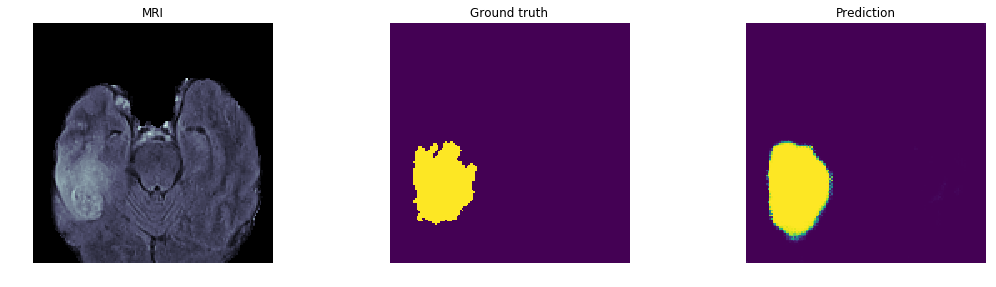

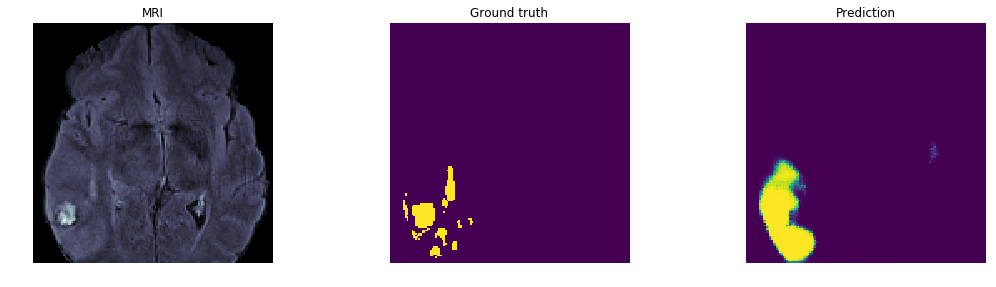

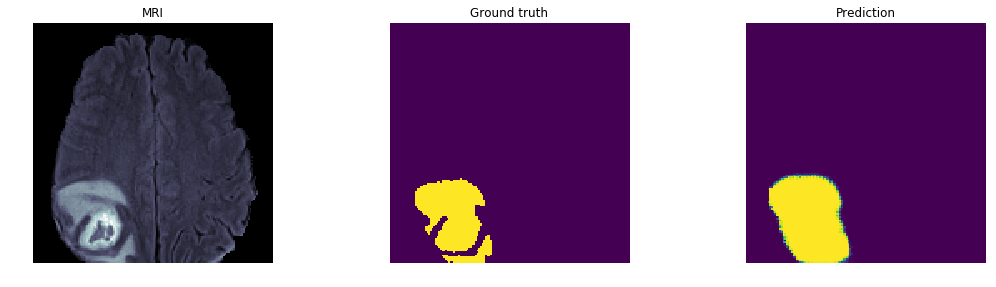

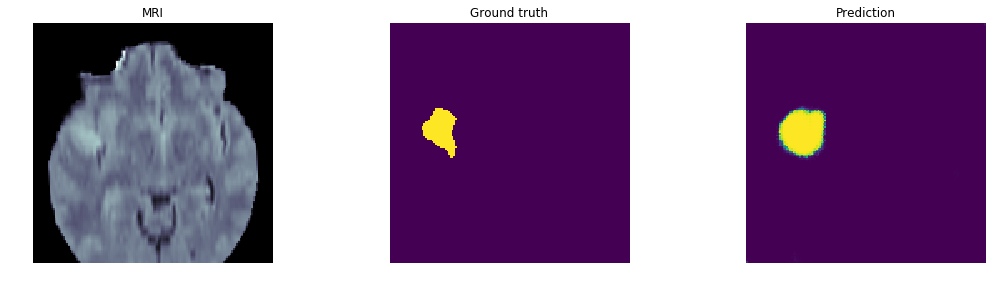

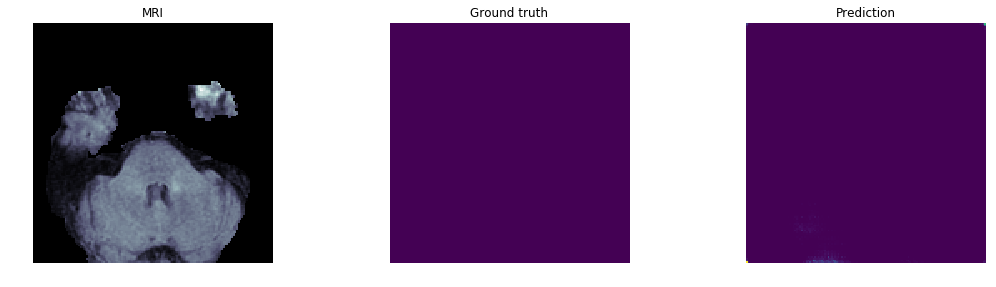

...

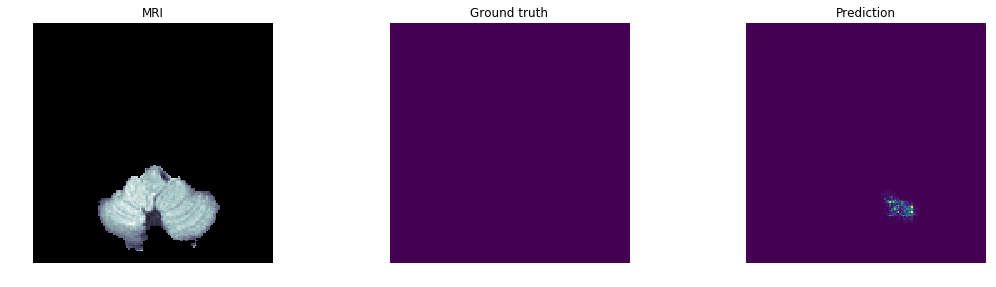

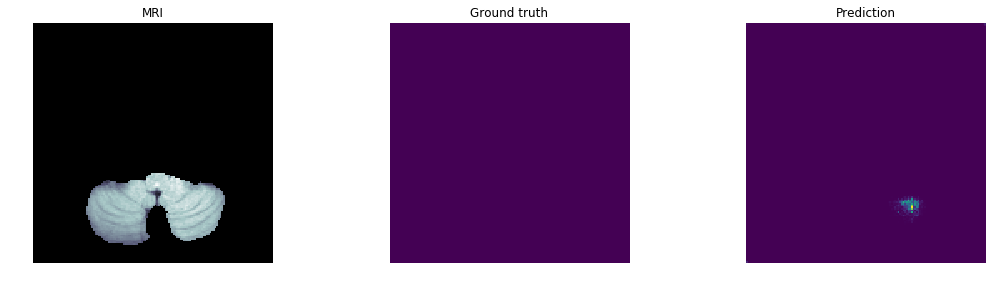

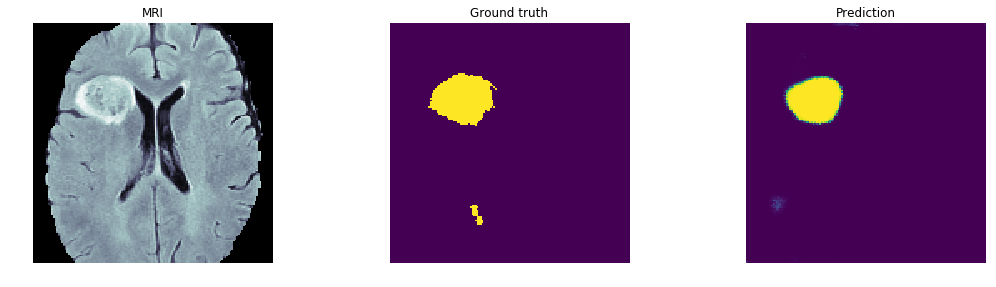

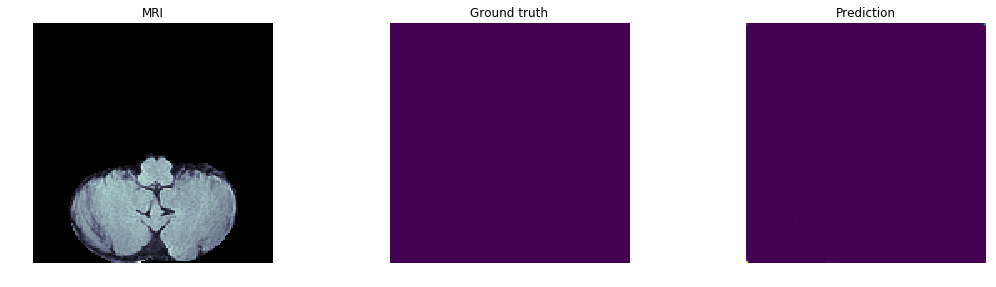

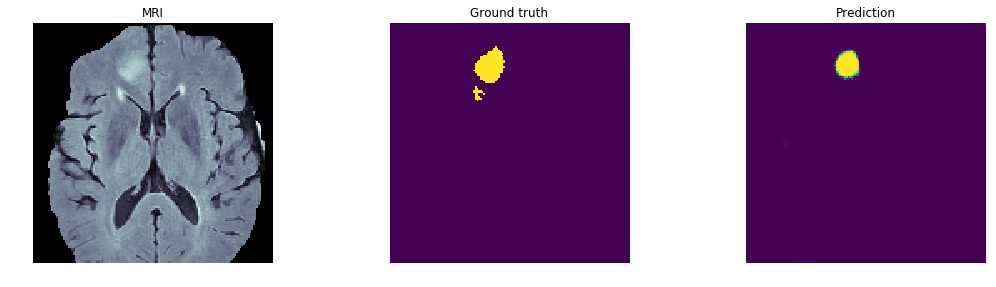

[ INFO ] Image #61: Dice score = 0.3859
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


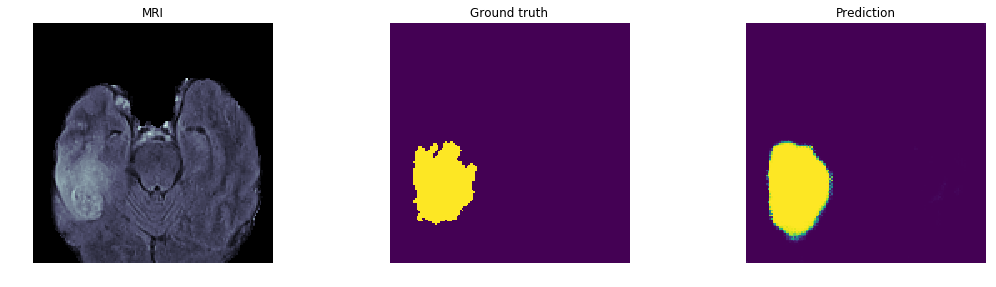

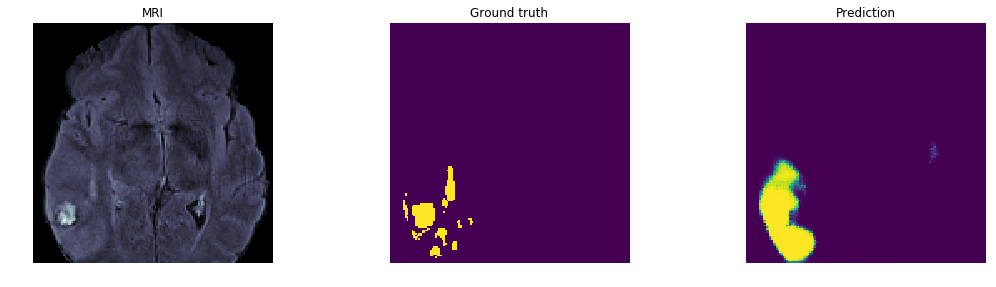

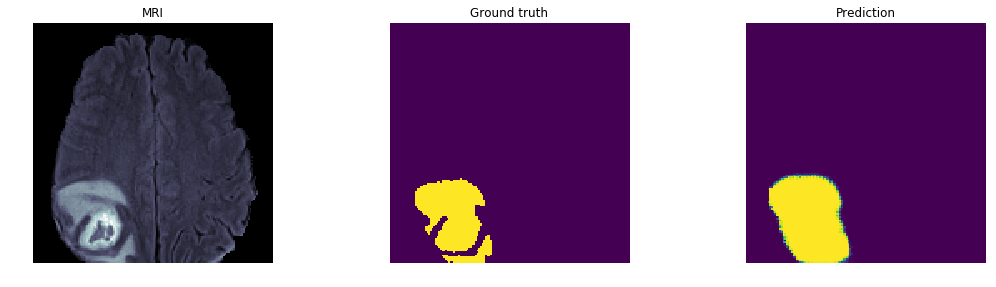

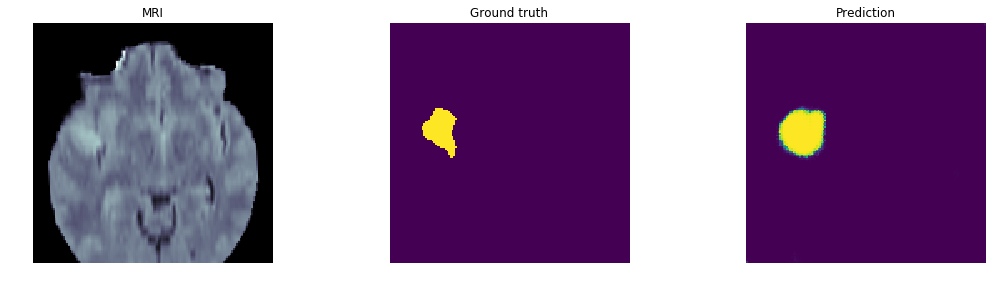

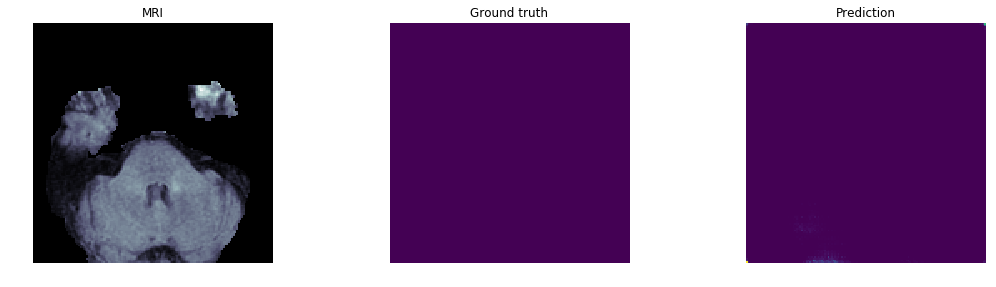

...

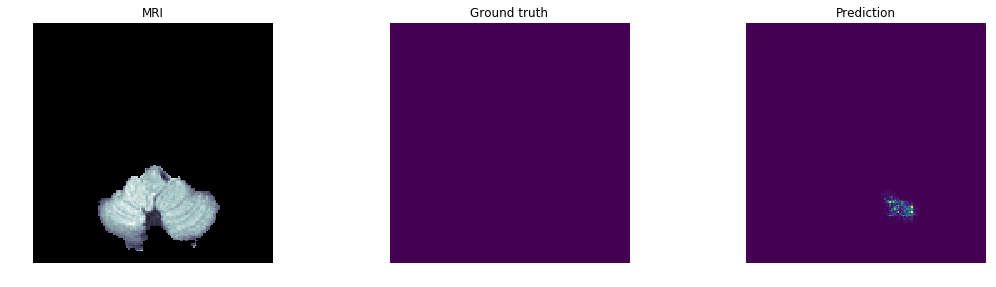

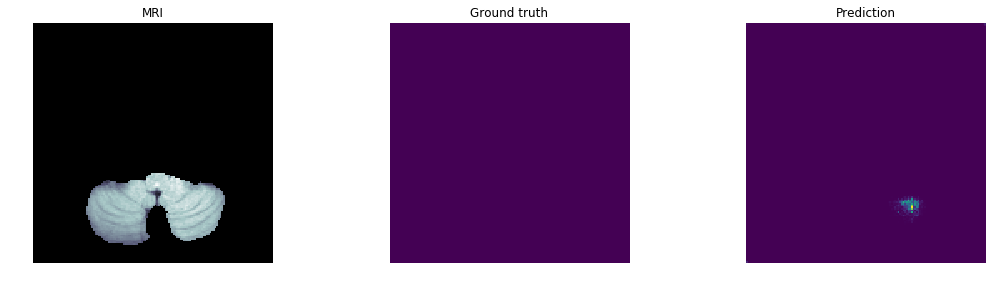

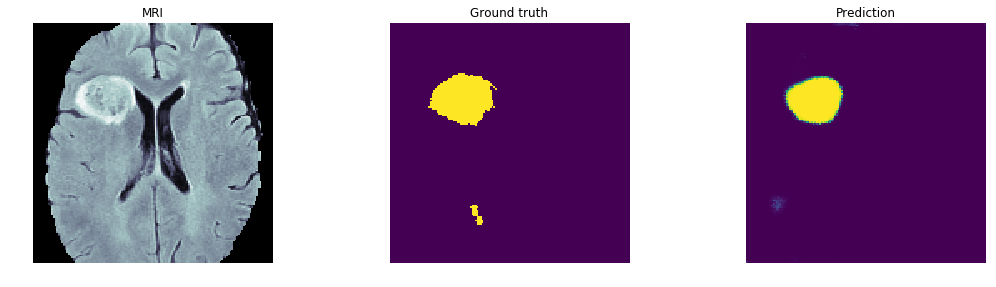

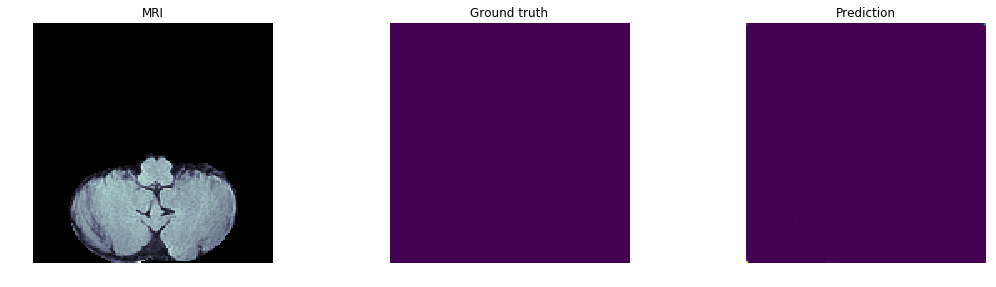

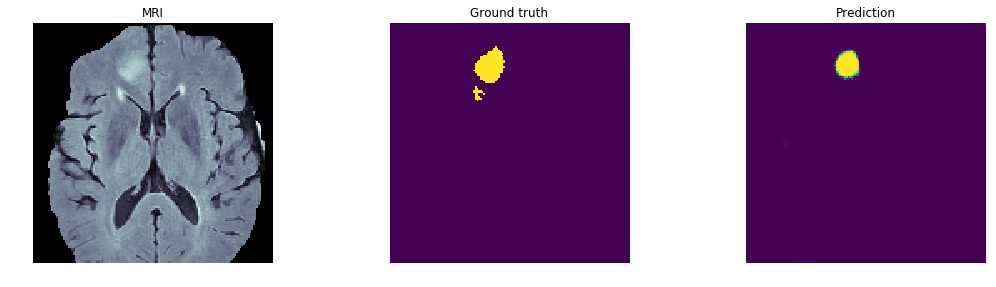

[ INFO ] Image #101: Dice score = 0.8540
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


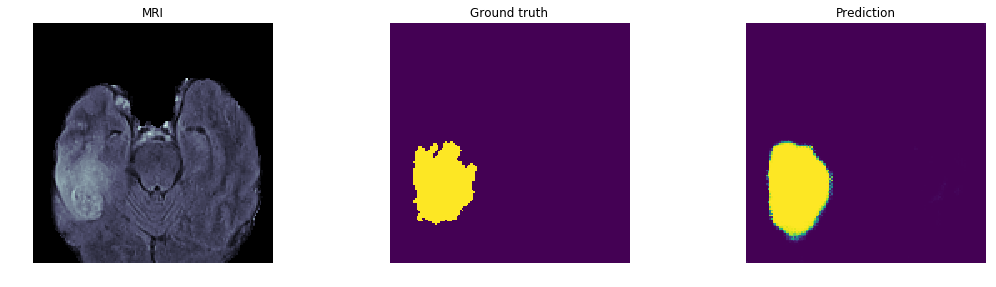

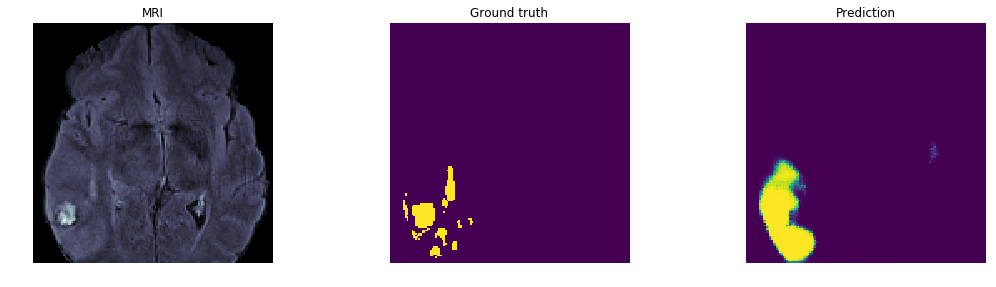

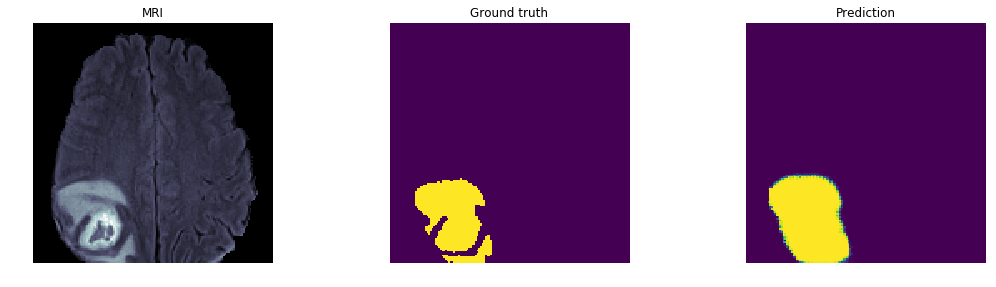

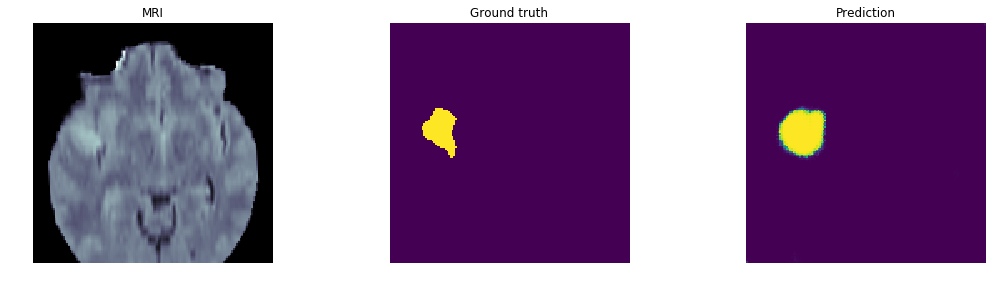

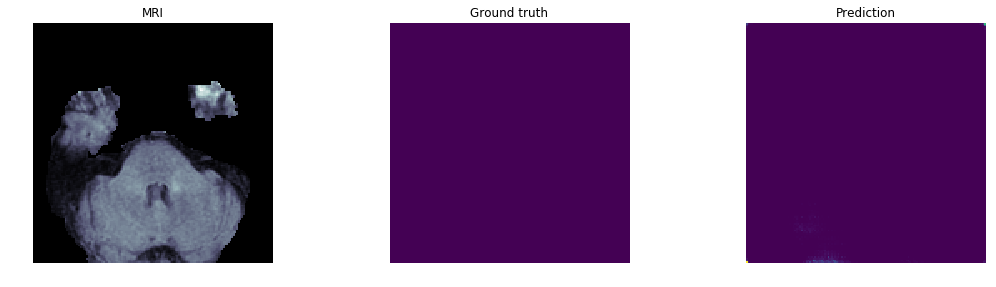

...

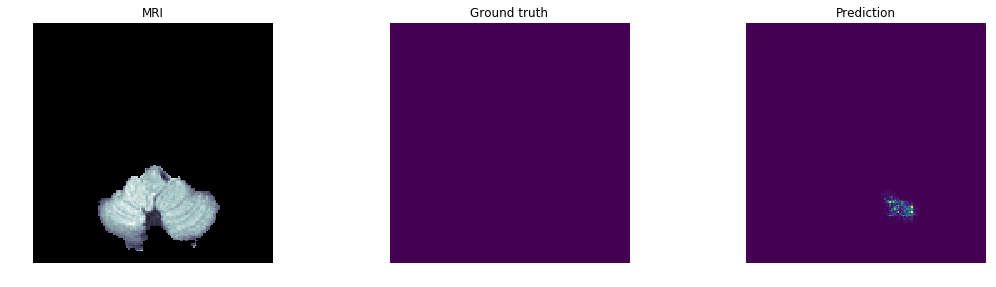

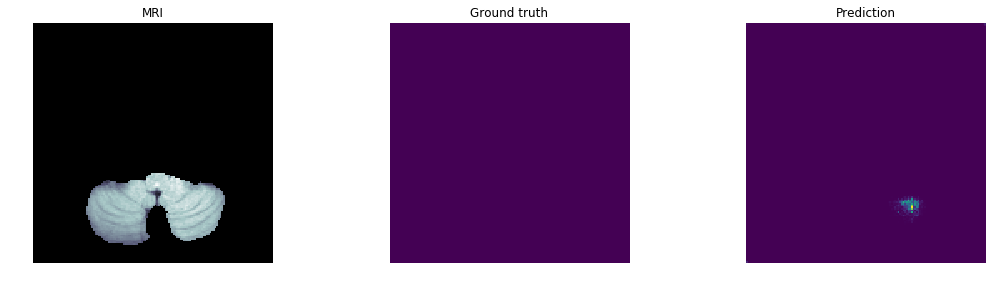

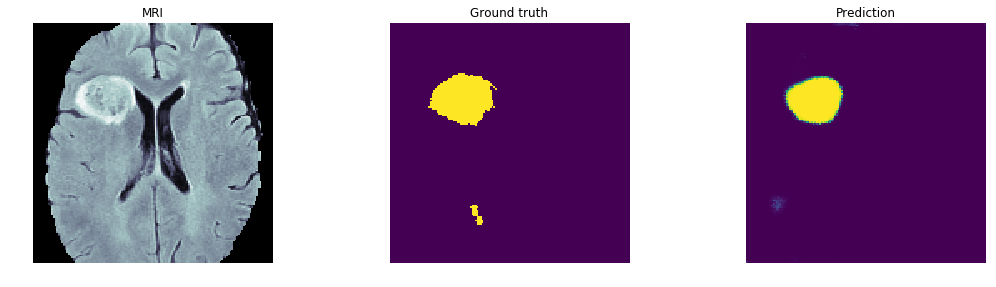

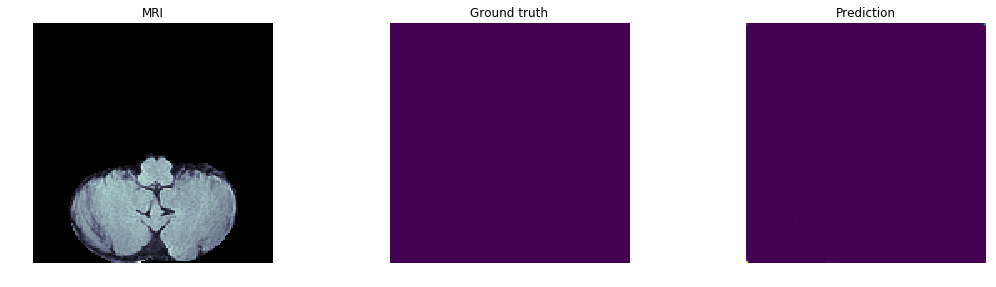

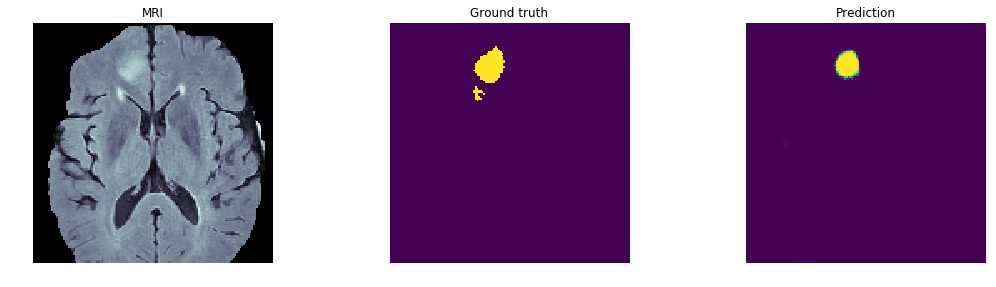

[ INFO ] Image #203: Dice score = 0.7110
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


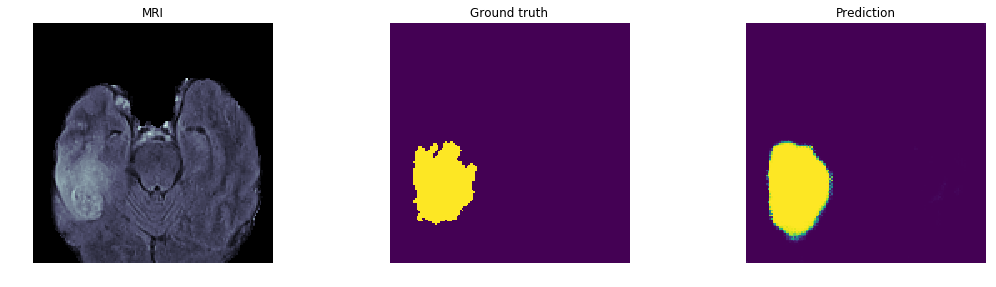

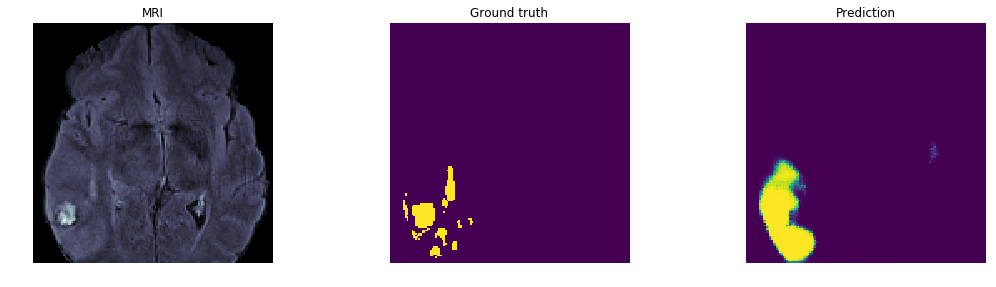

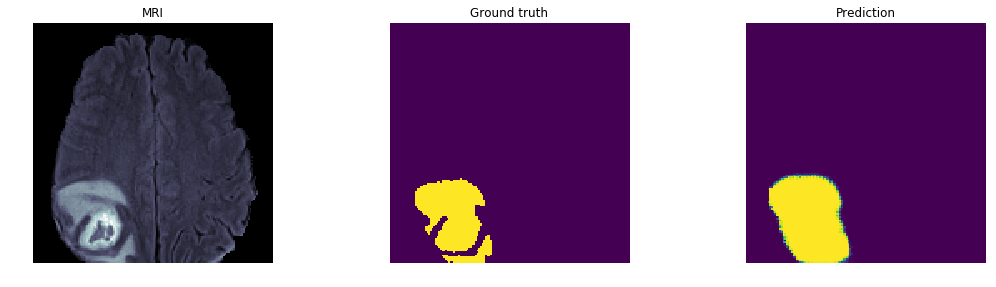

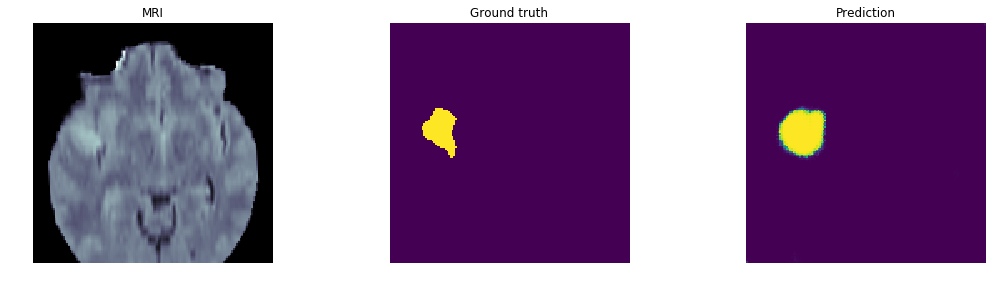

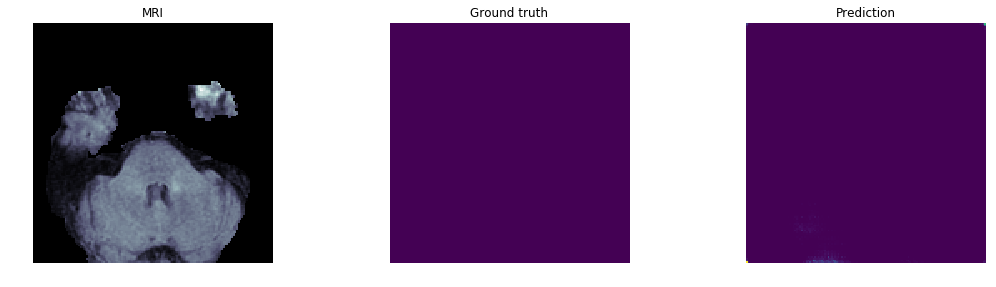

...

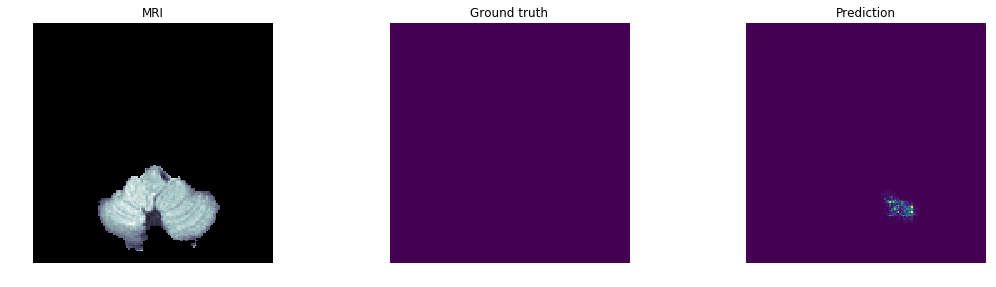

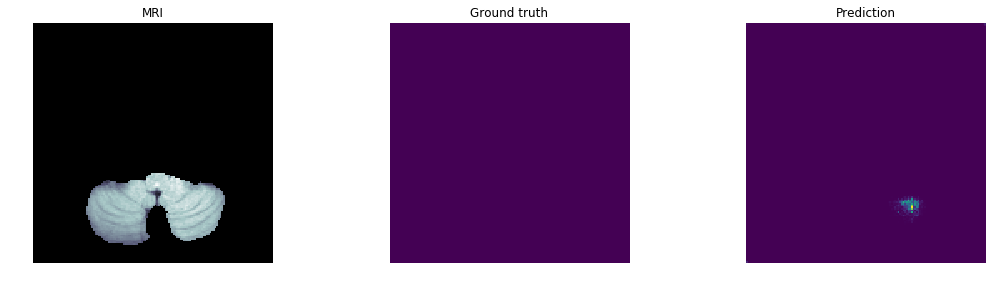

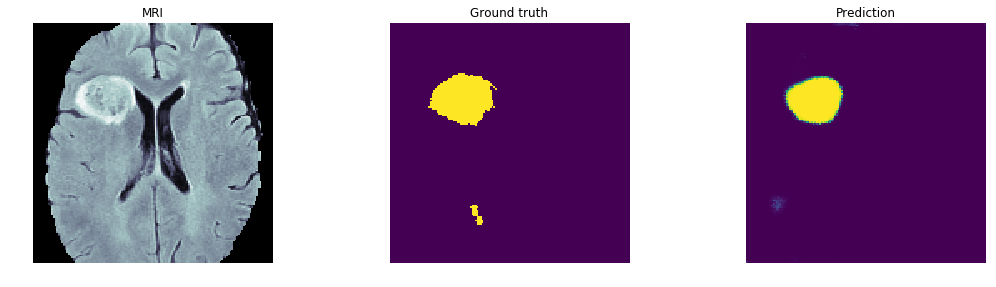

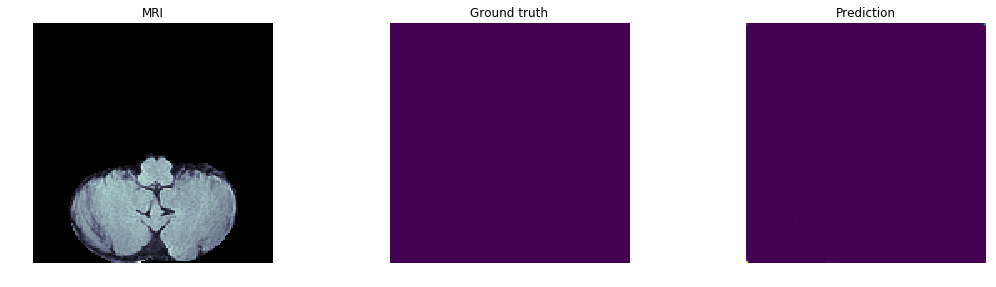

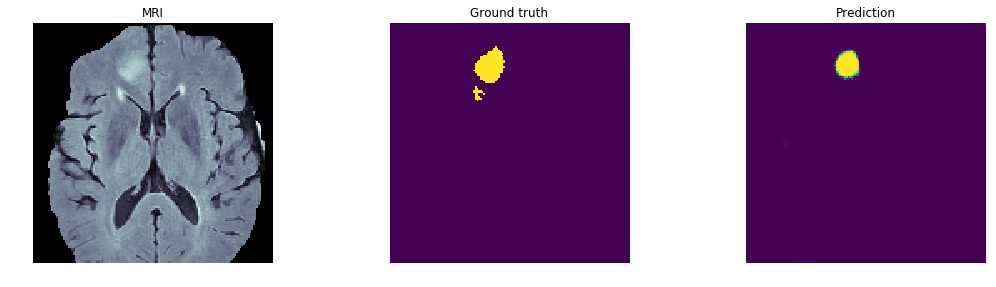

[ INFO ] Image #309: Dice score = 0.5390
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


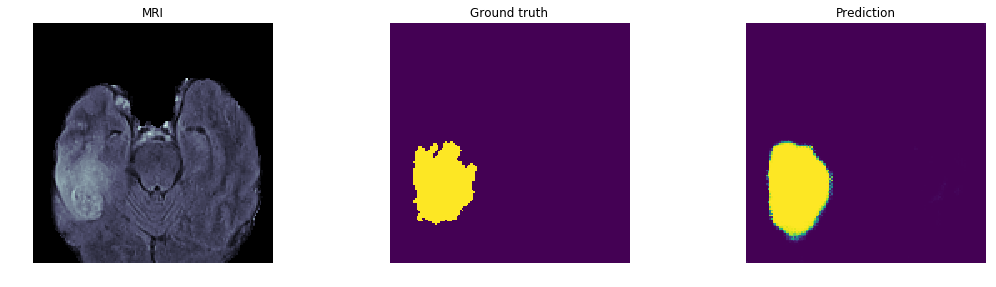

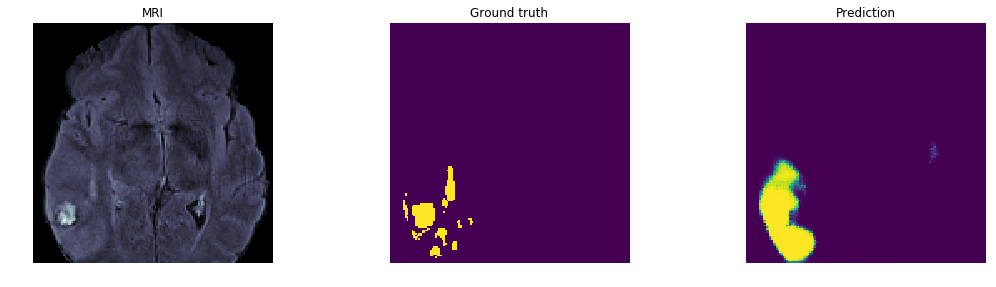

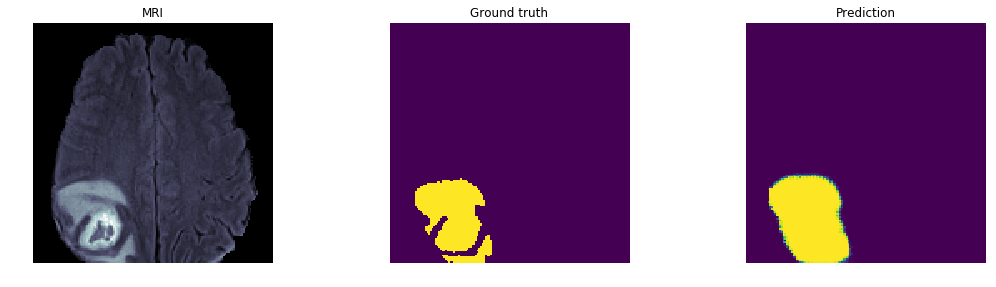

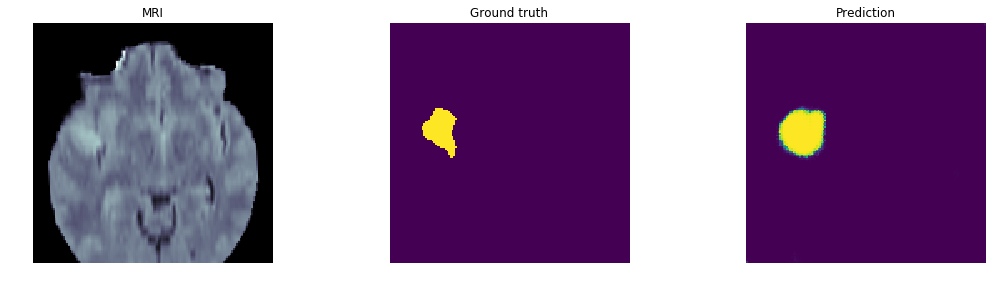

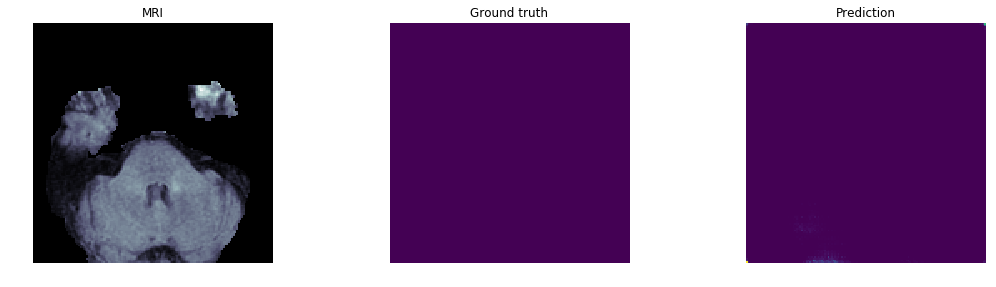

...

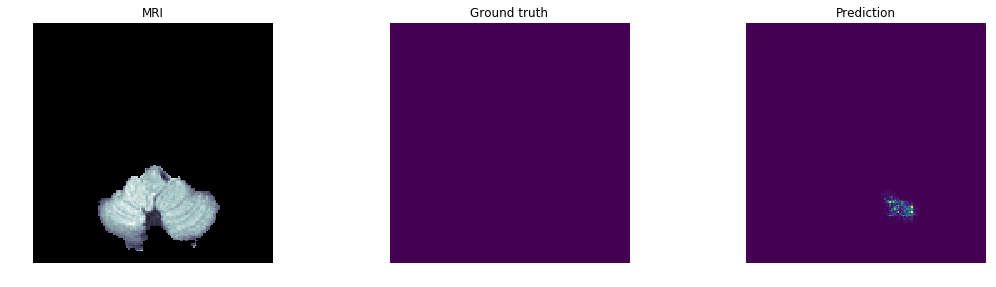

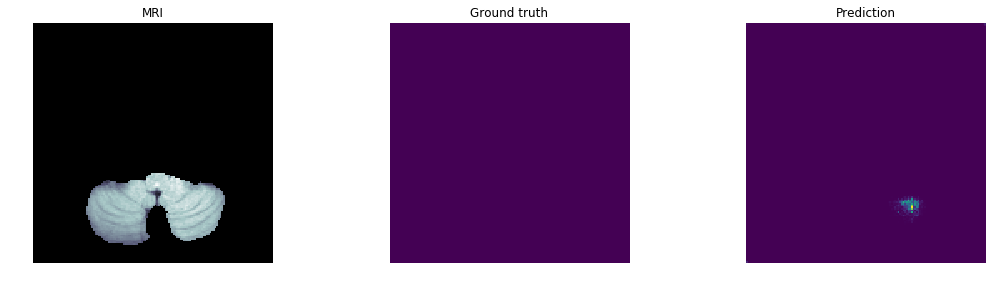

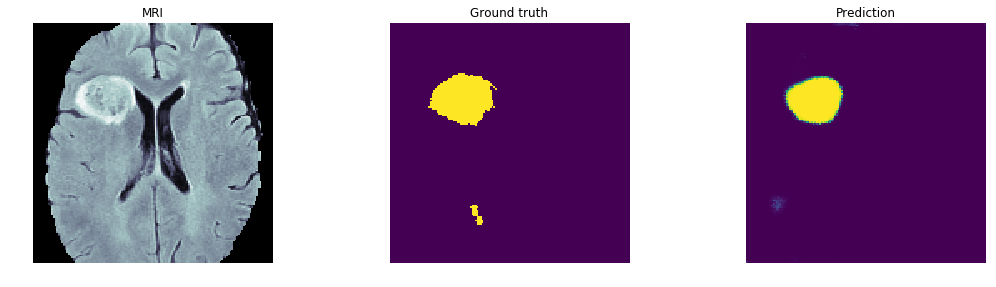

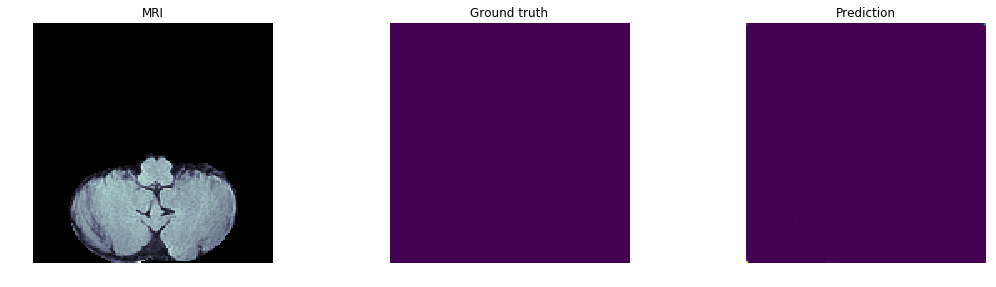

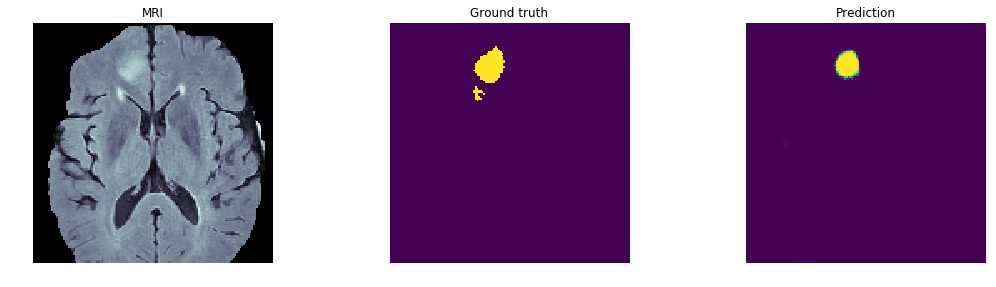

[ INFO ] Image #400: Dice score = 0.8492
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


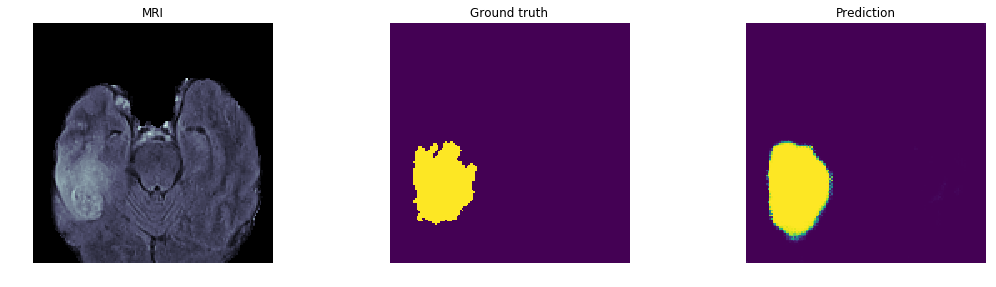

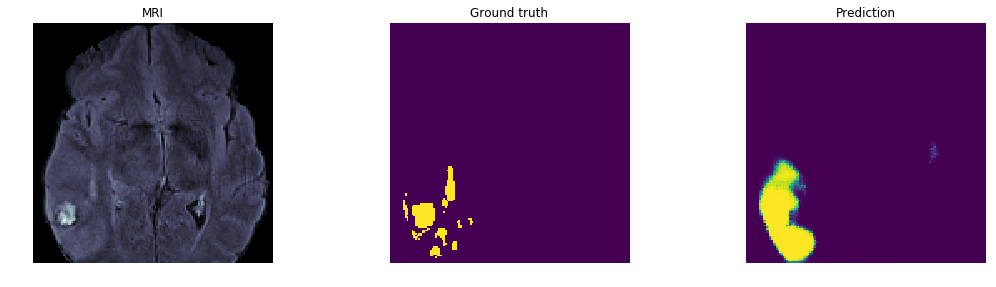

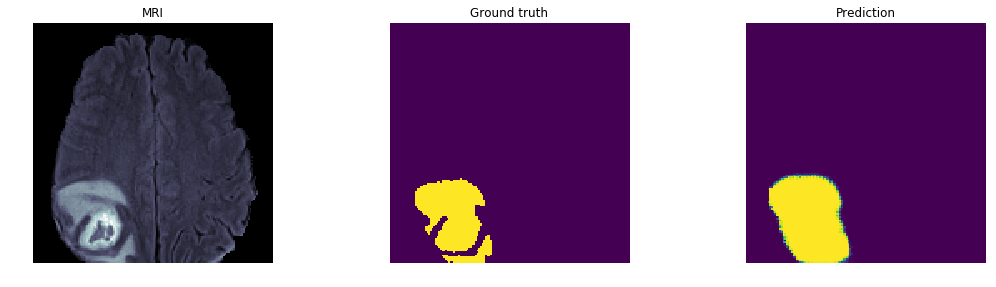

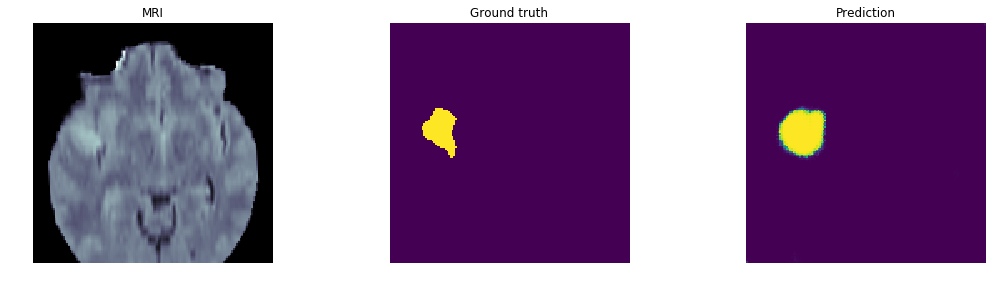

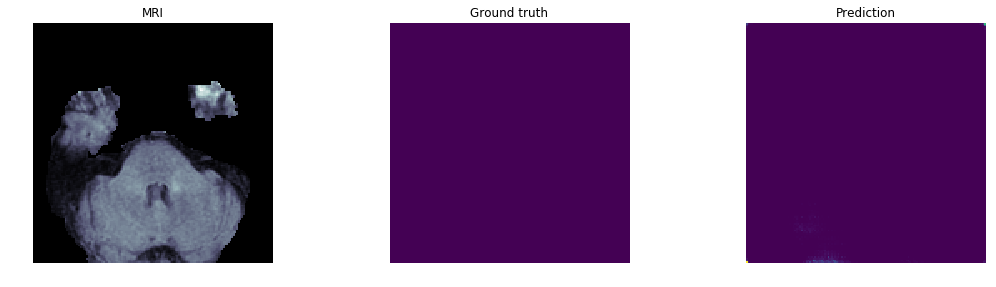

...

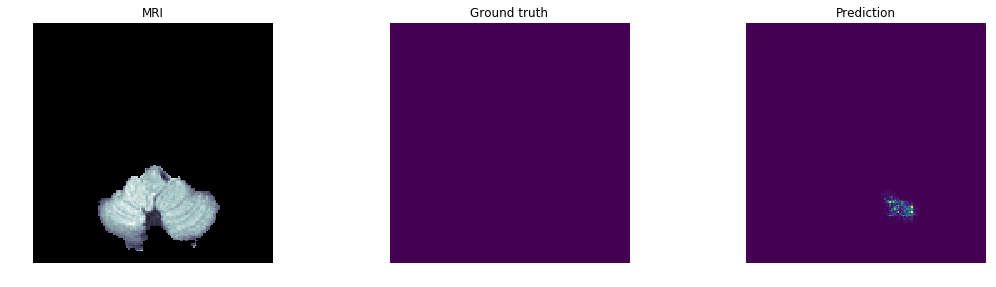

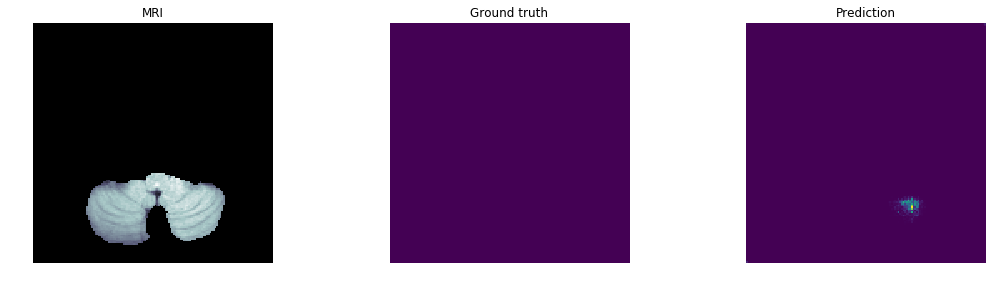

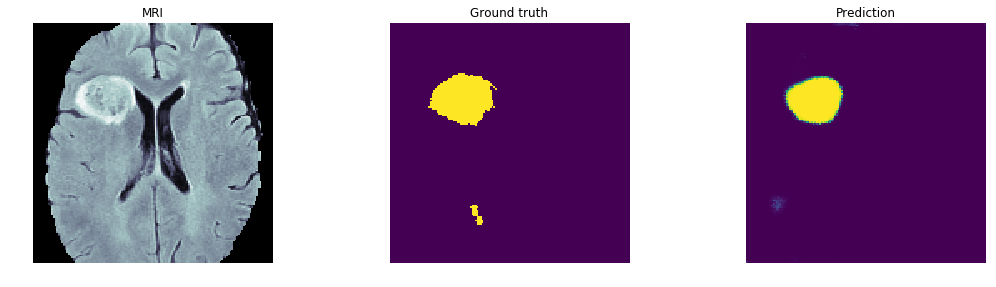

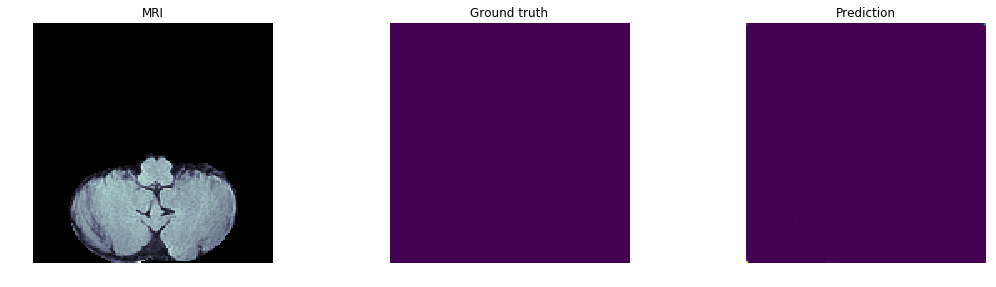

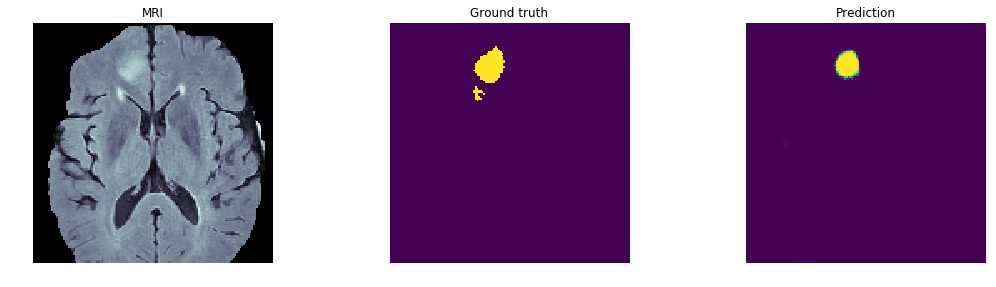

[ INFO ] Image #1100: Dice score = 0.9197
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


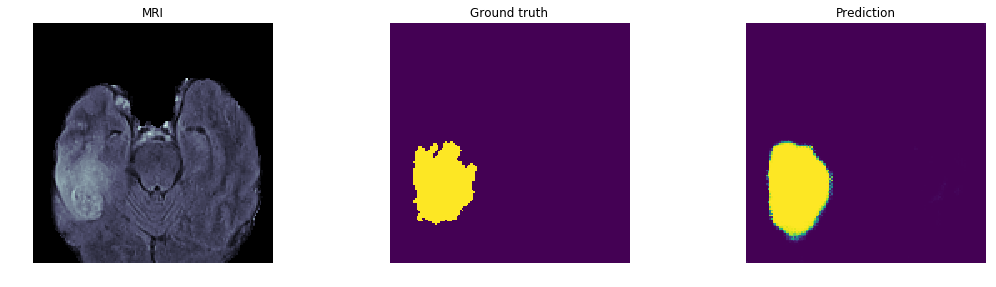

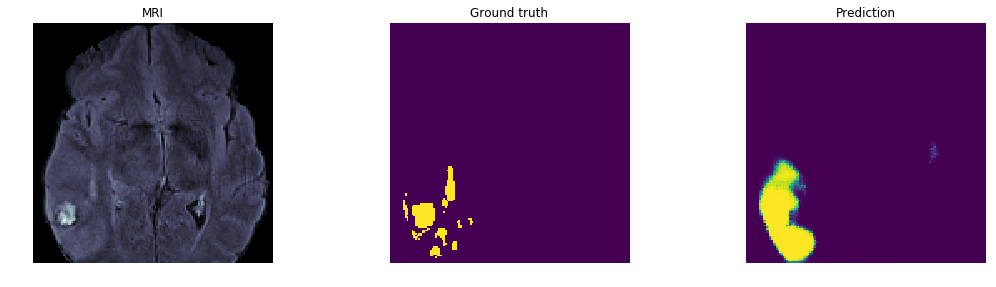

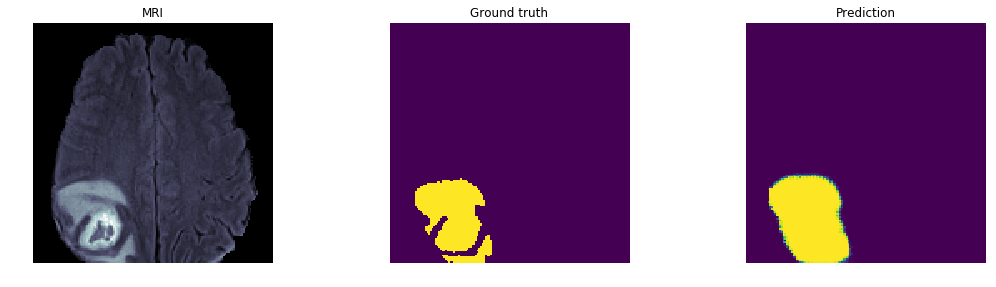

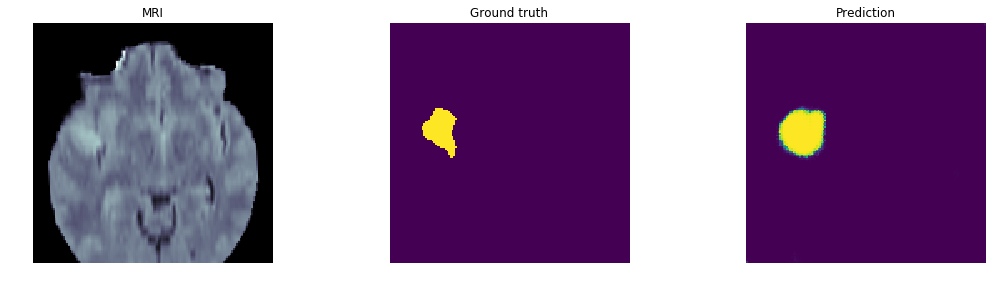

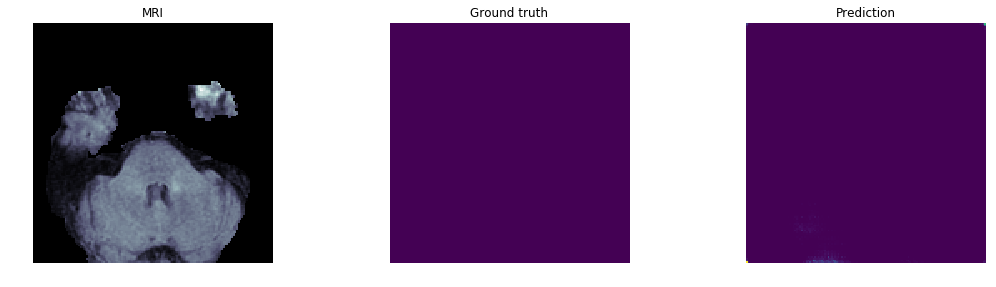

...

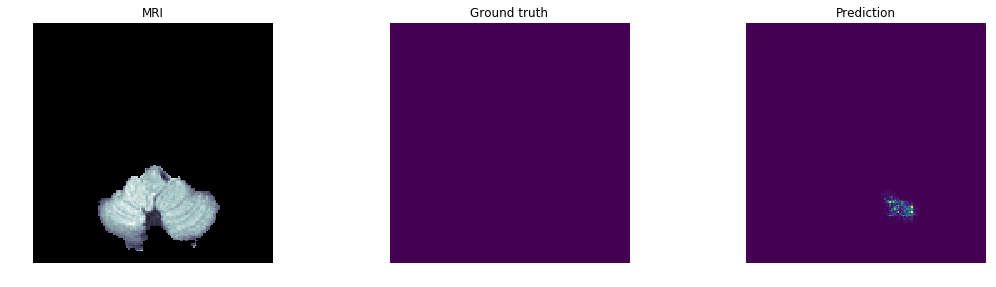

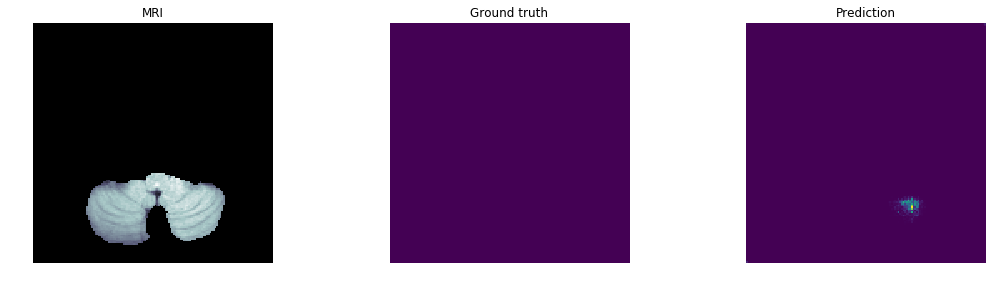

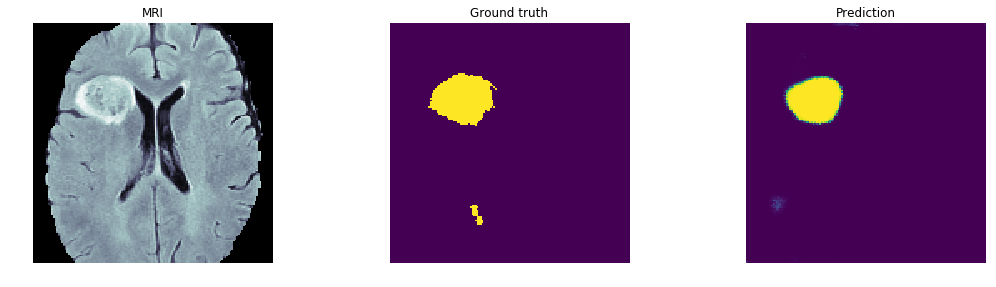

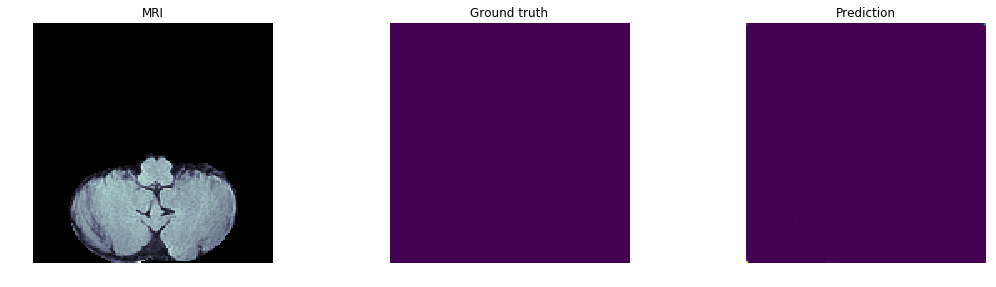

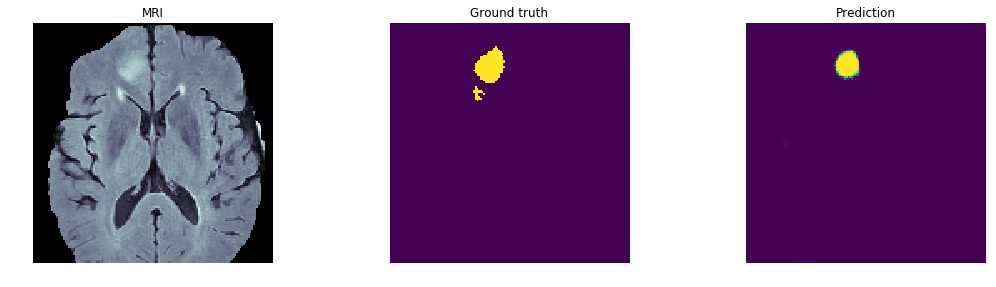

[ INFO ] Image #1509: Dice score = 0.6381
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


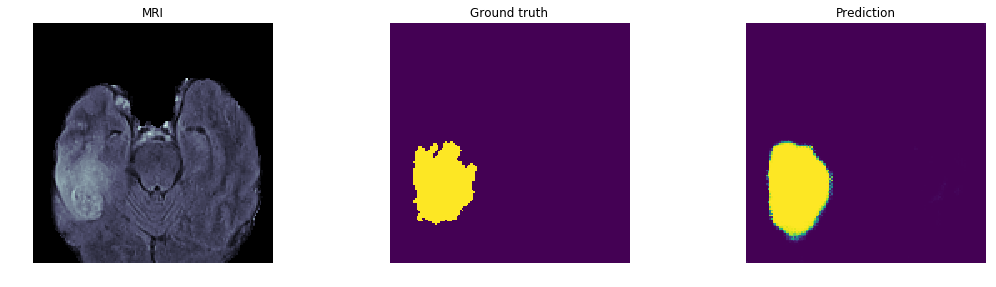

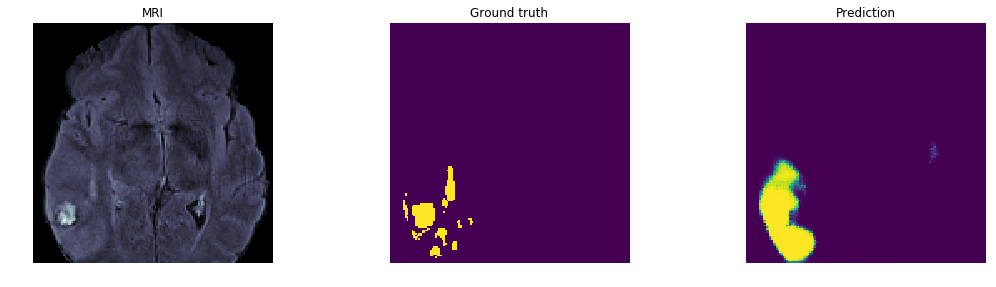

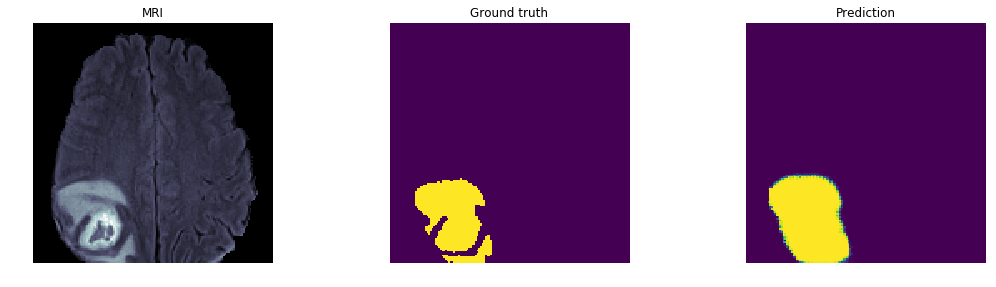

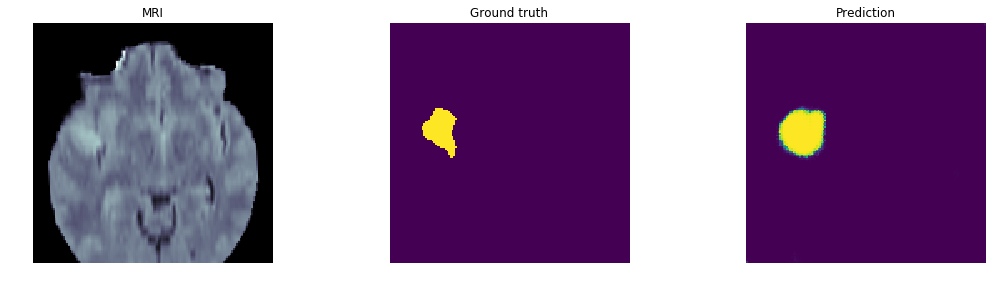

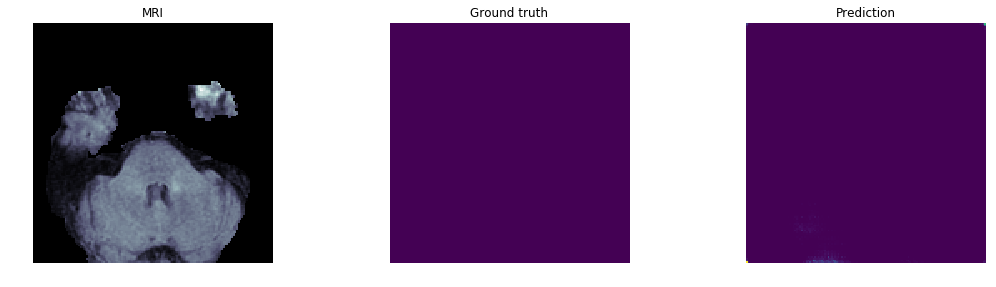

...

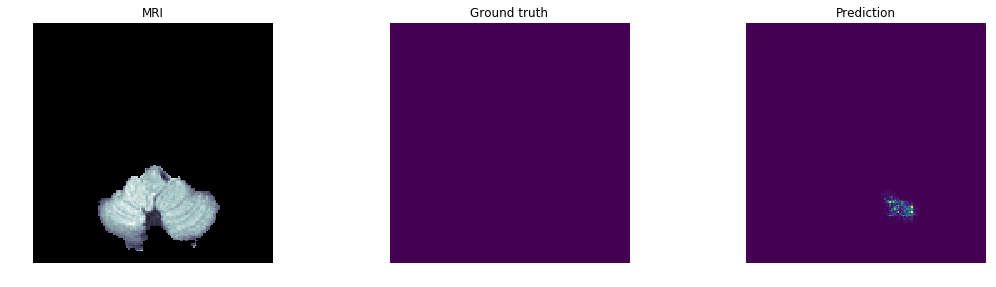

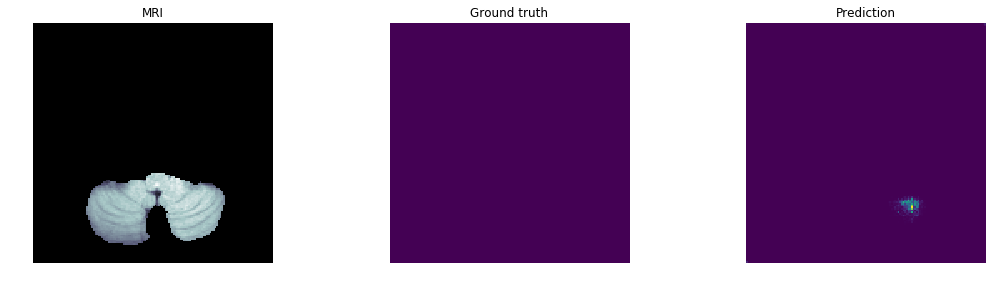

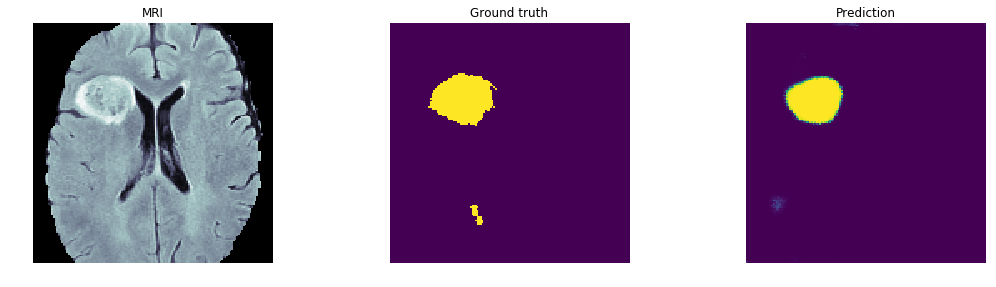

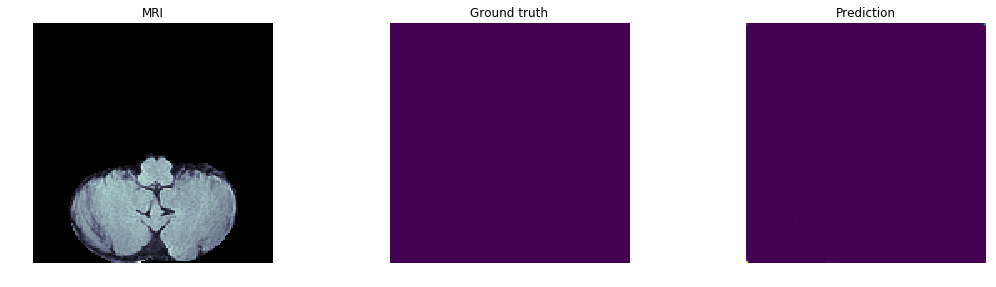

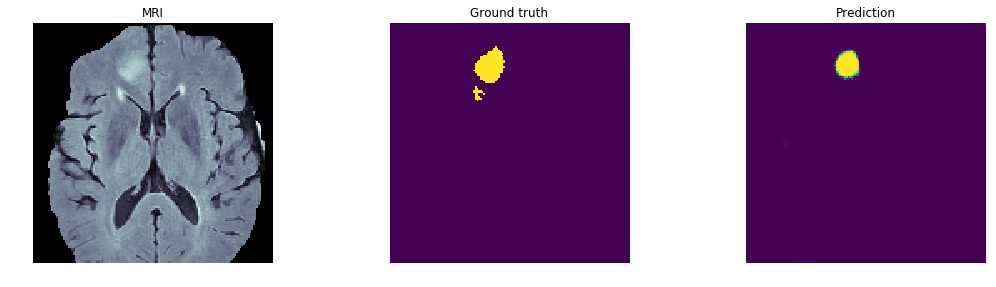

[ INFO ] Image #1790: Dice score = 0.9020
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


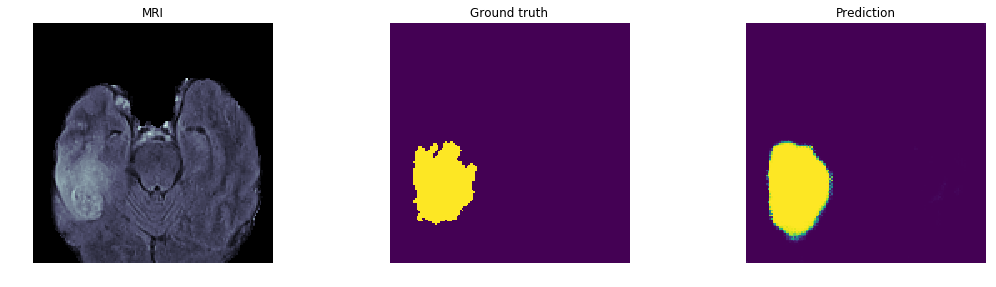

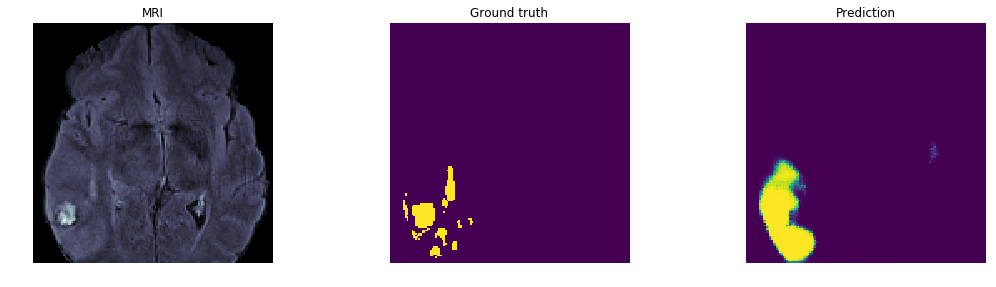

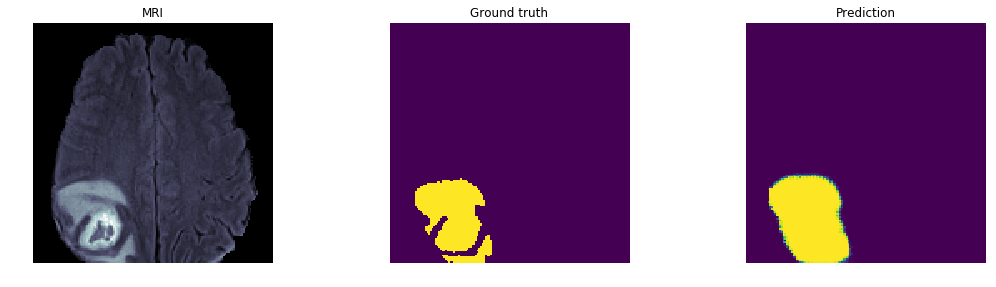

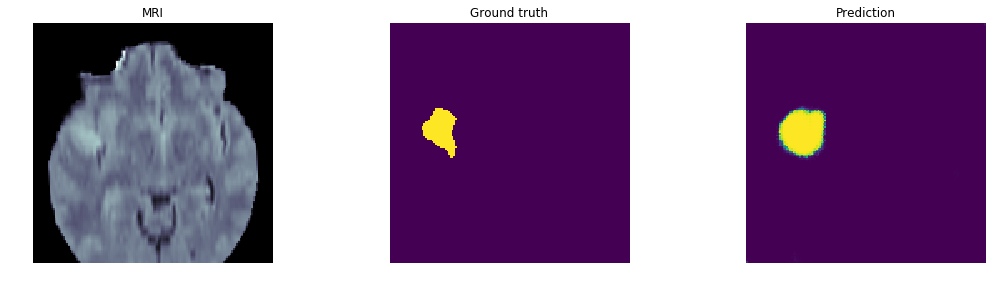

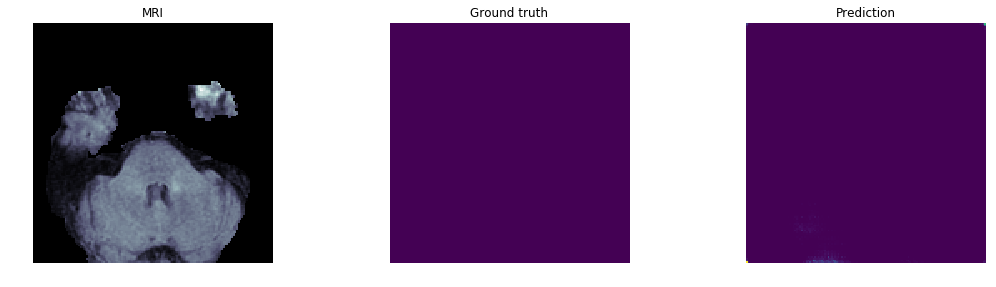

...

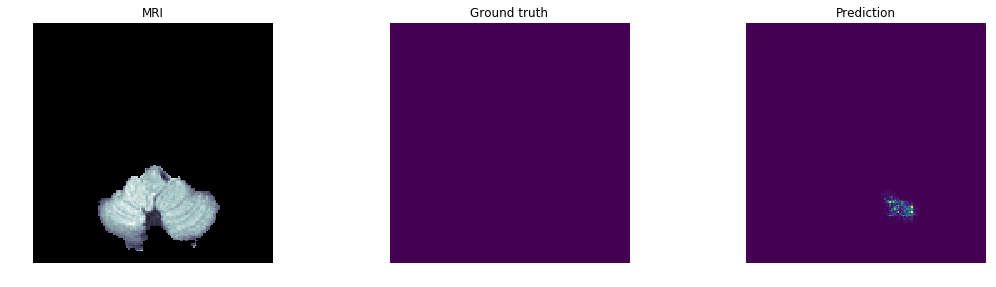

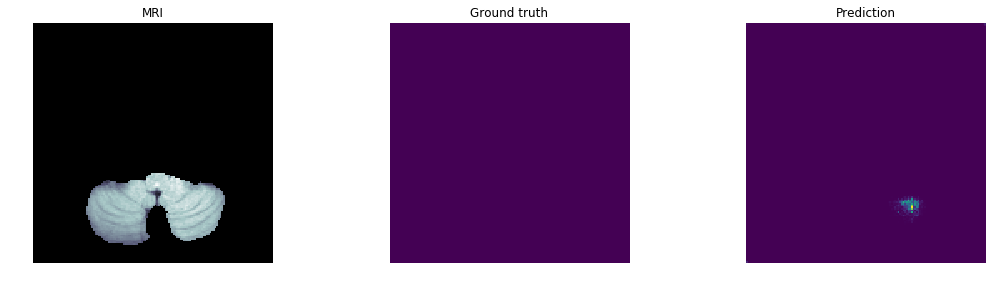

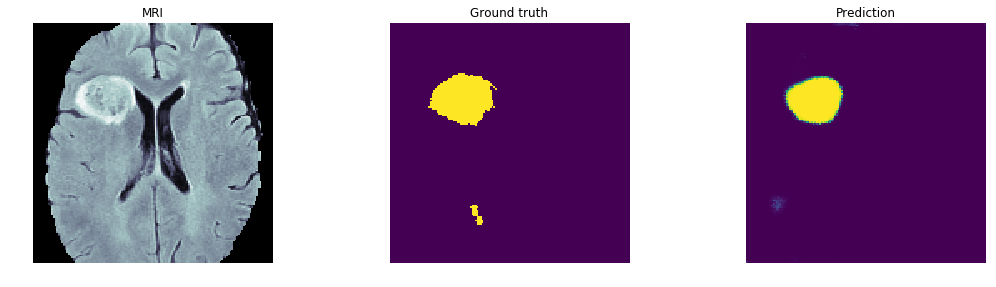

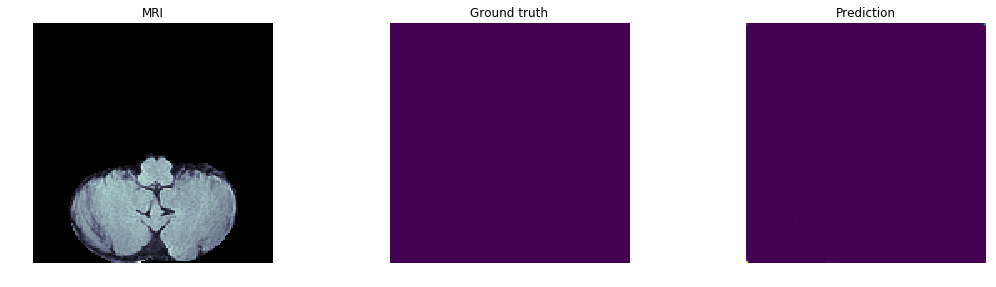

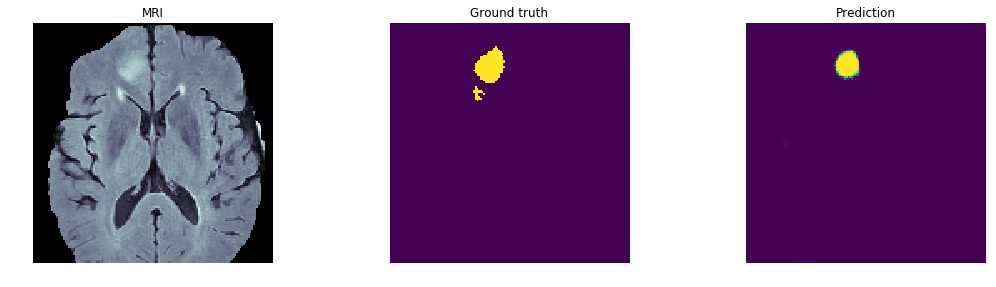

[ INFO ] Image #1876: Dice score = 0.0289
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


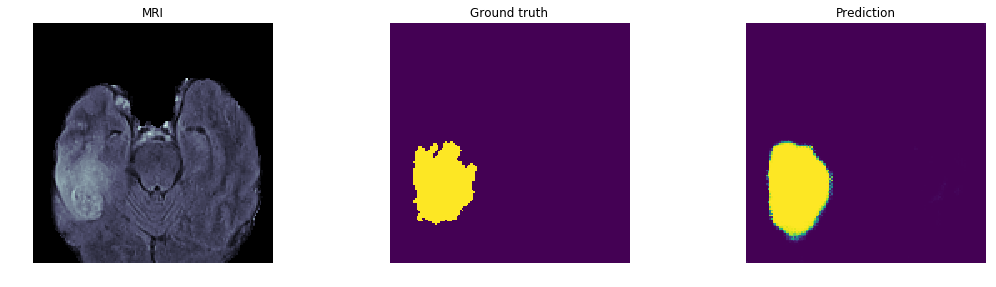

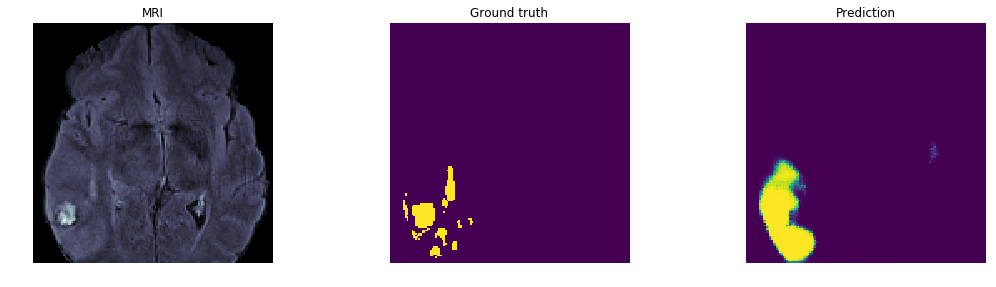

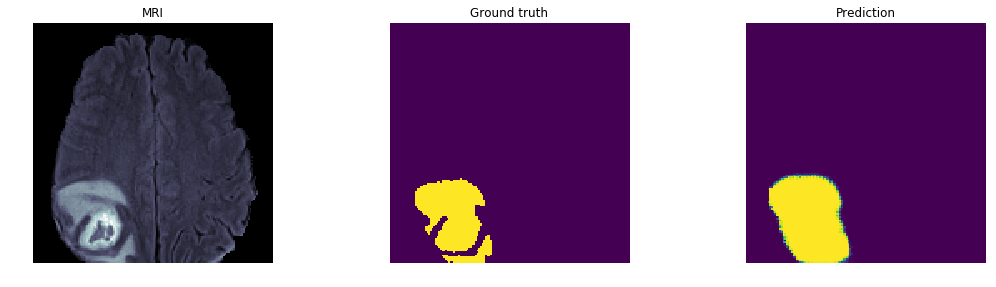

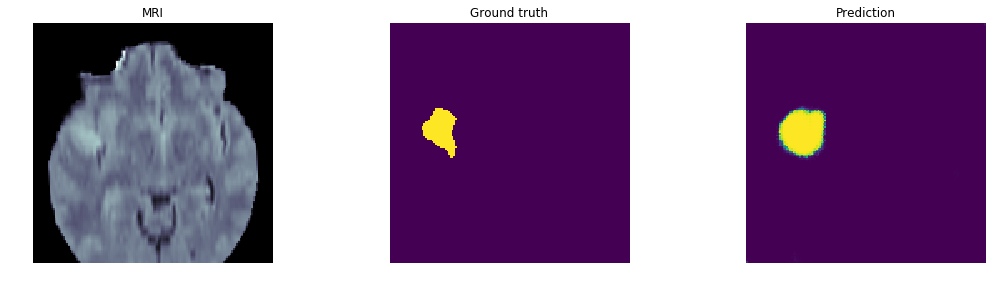

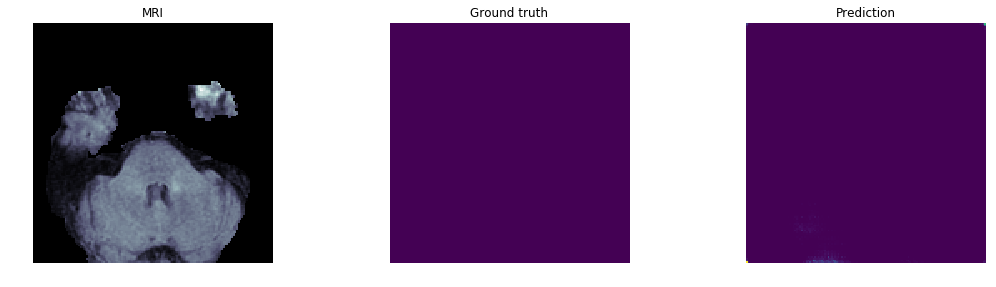

...

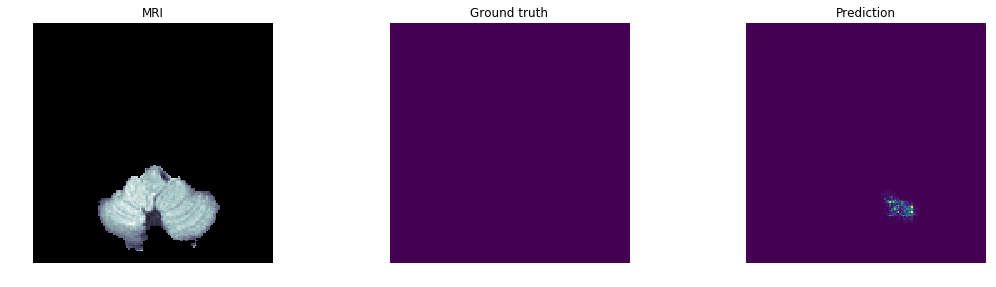

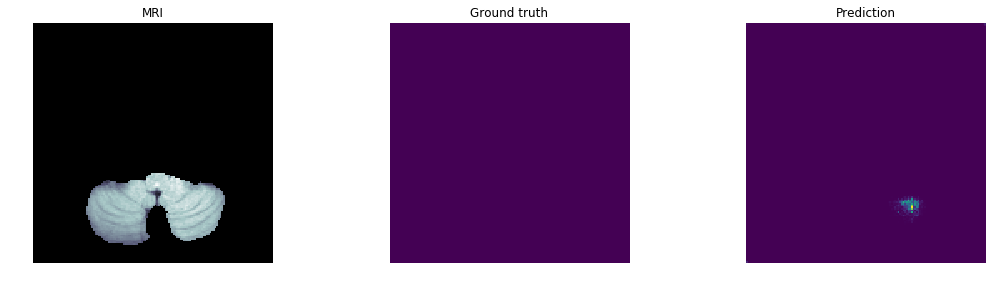

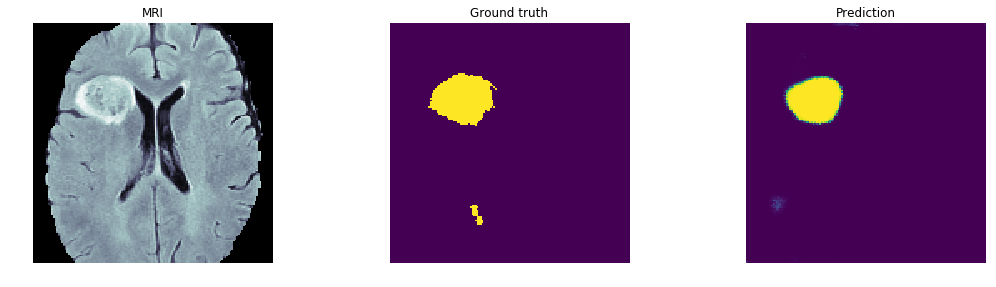

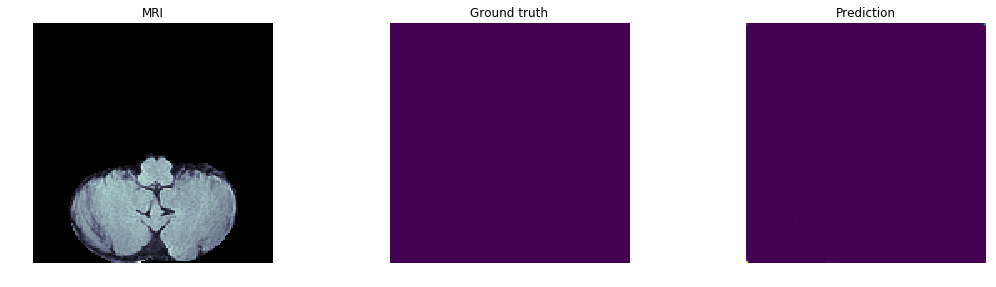

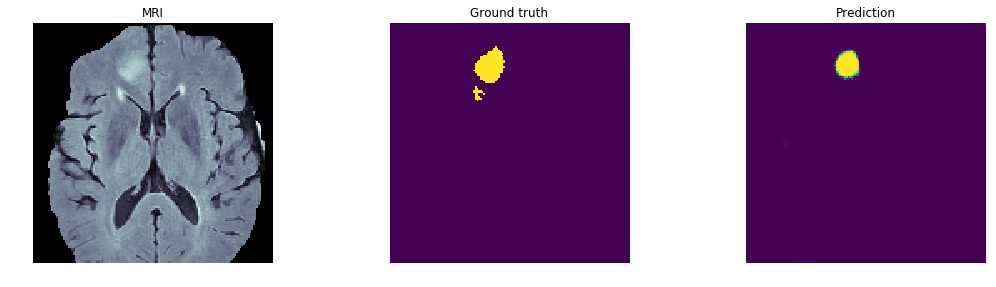

[ INFO ] Image #2309: Dice score = 0.0598
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


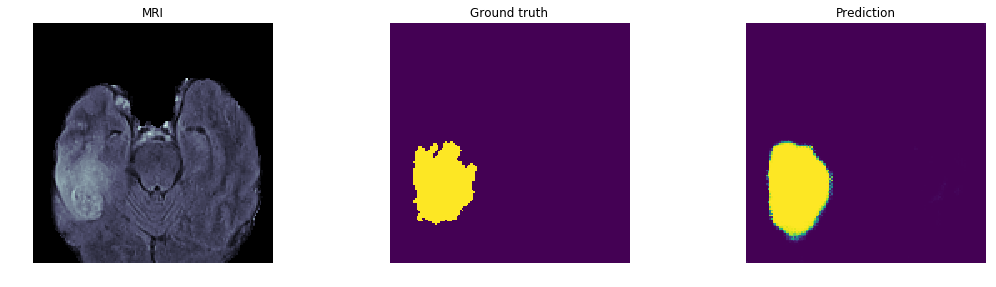

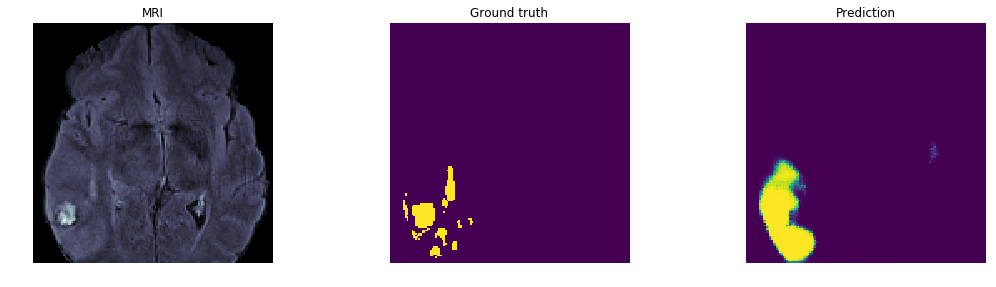

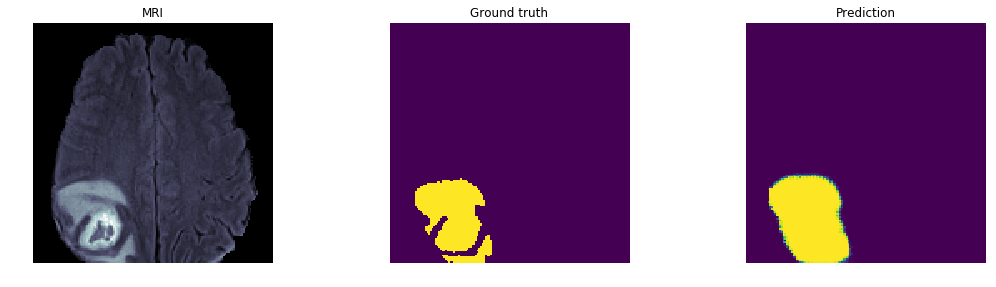

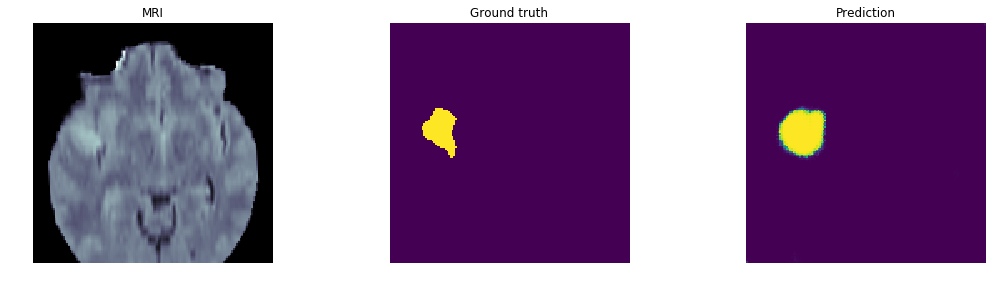

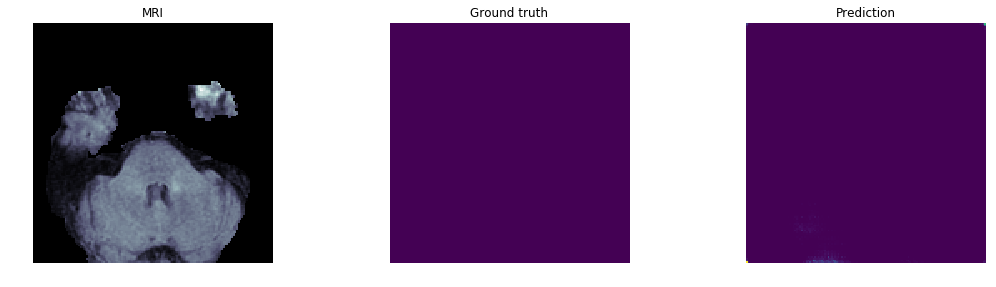

...

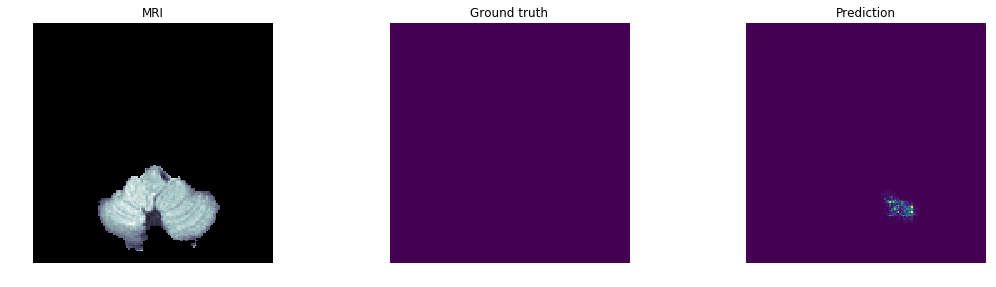

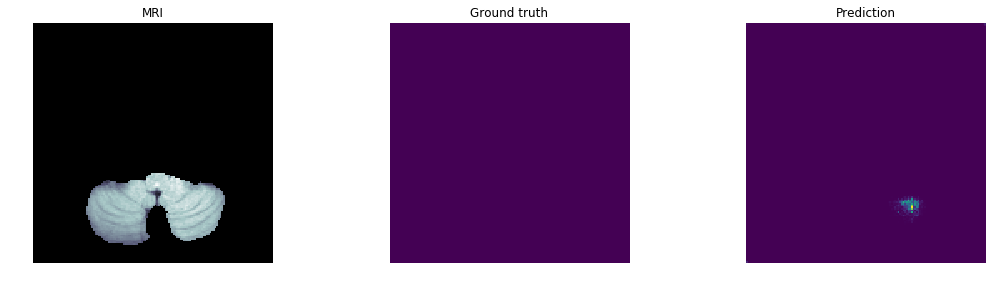

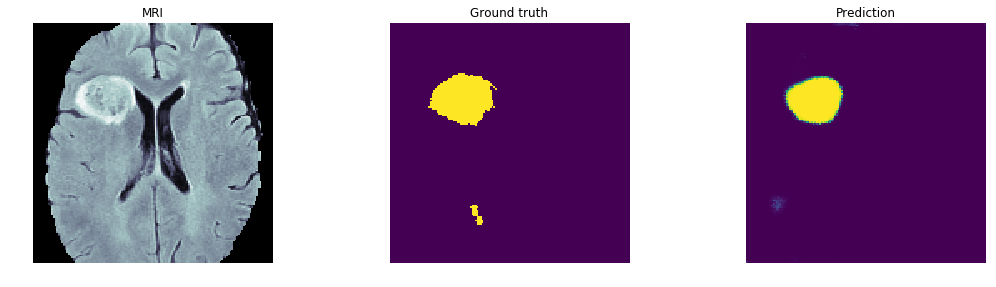

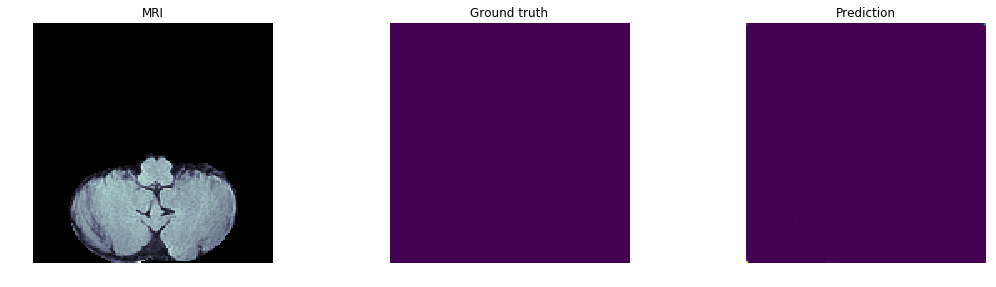

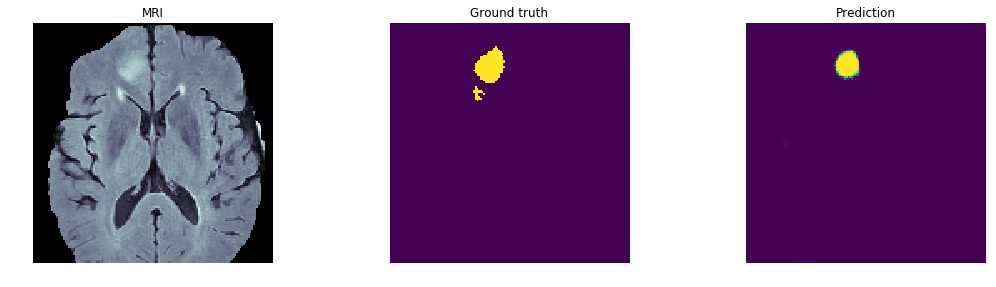

[ INFO ] Image #3678: Dice score = 0.8530
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


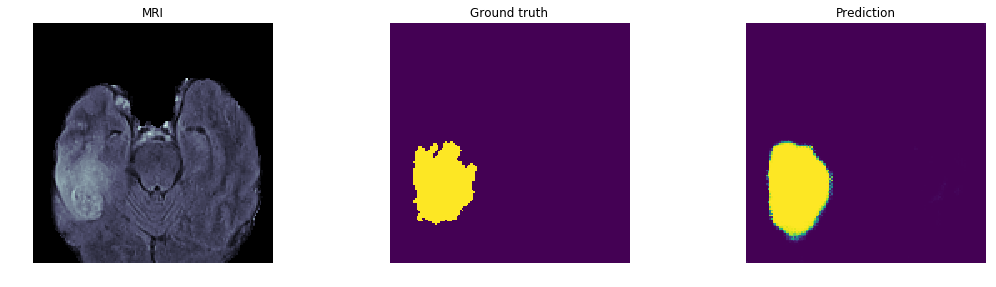

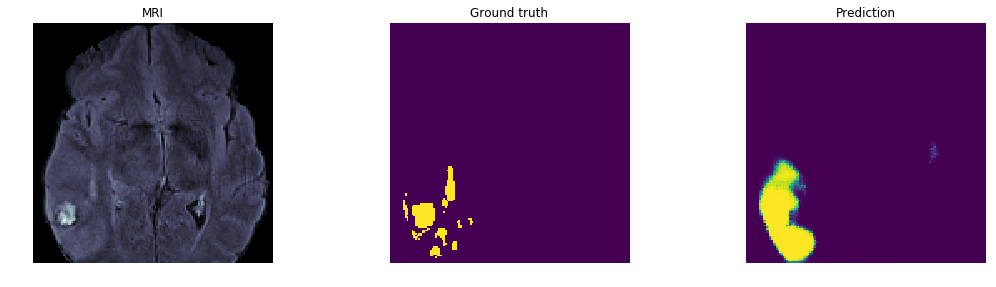

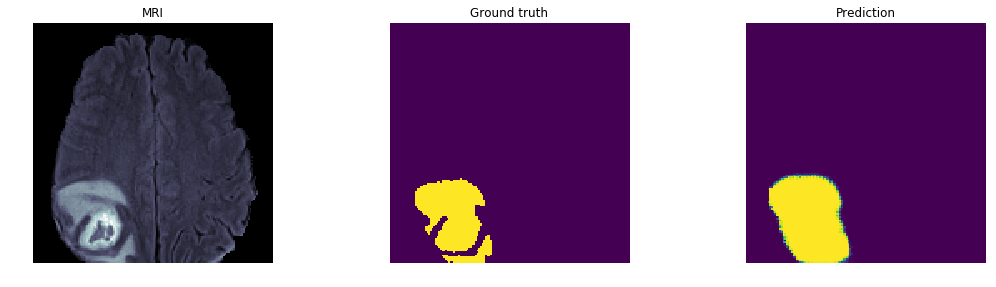

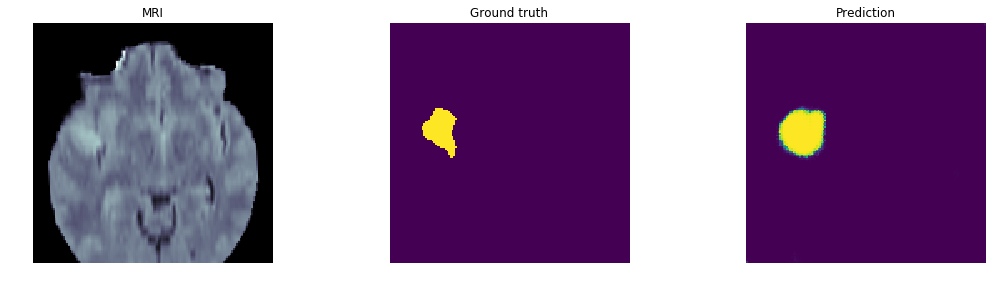

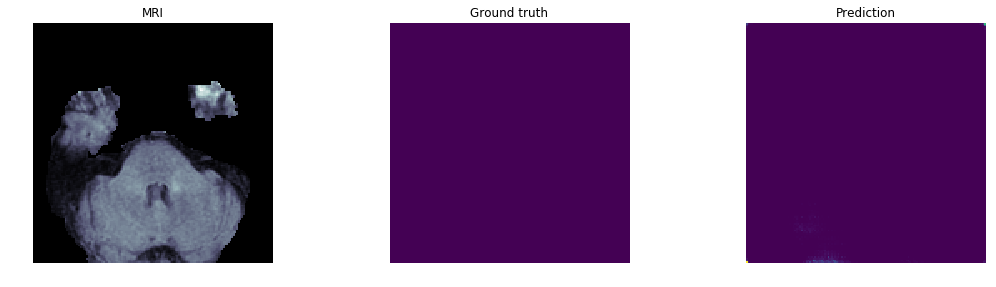

...

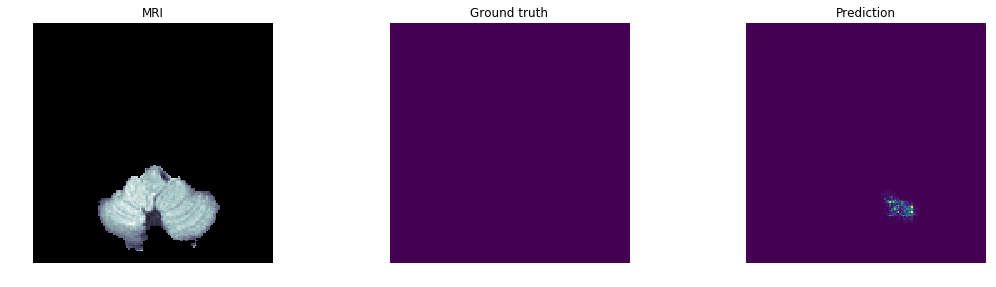

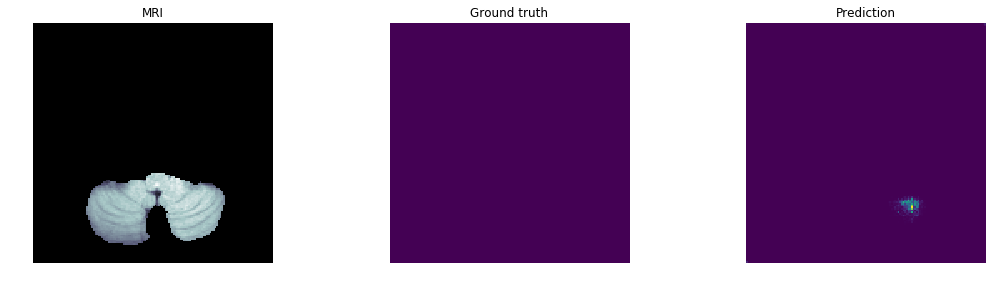

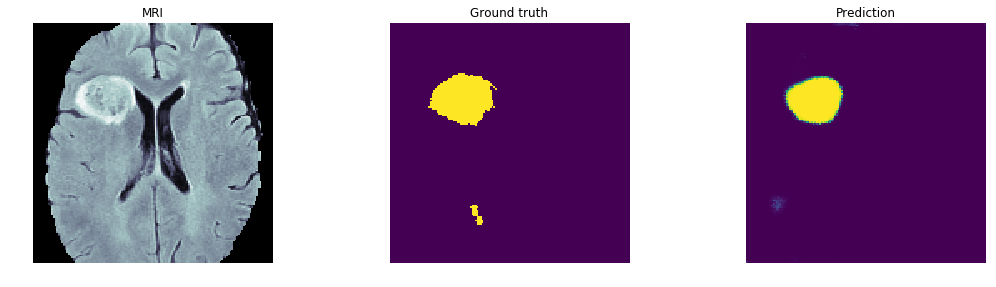

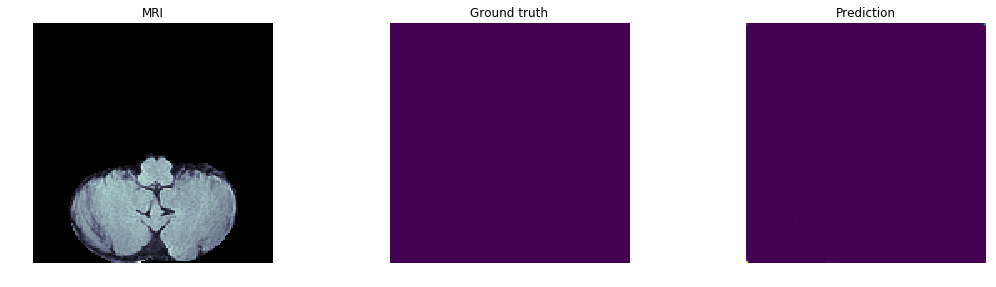

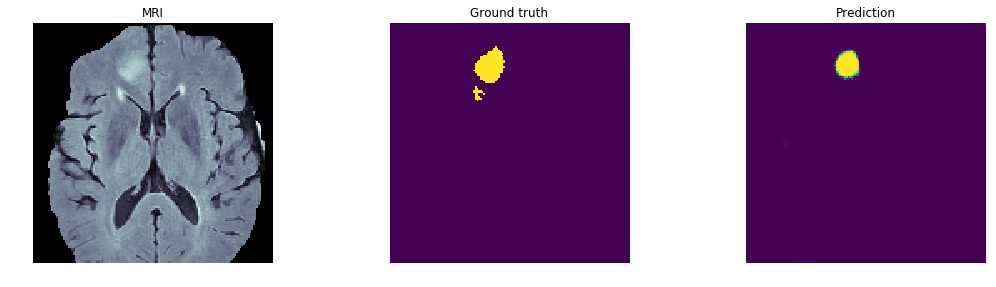

[ INFO ] Image #3898: Dice score = 0.7659
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


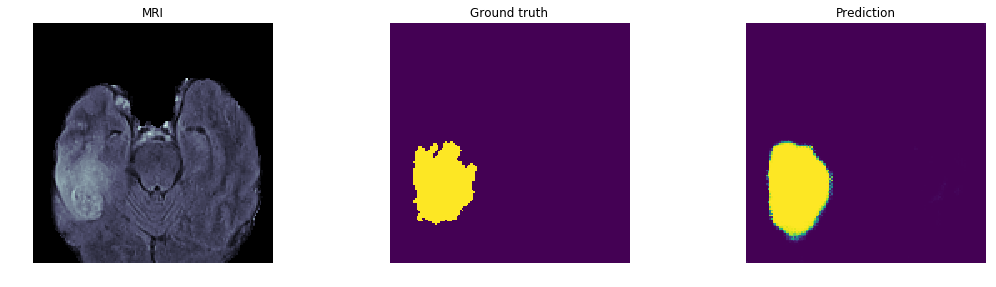

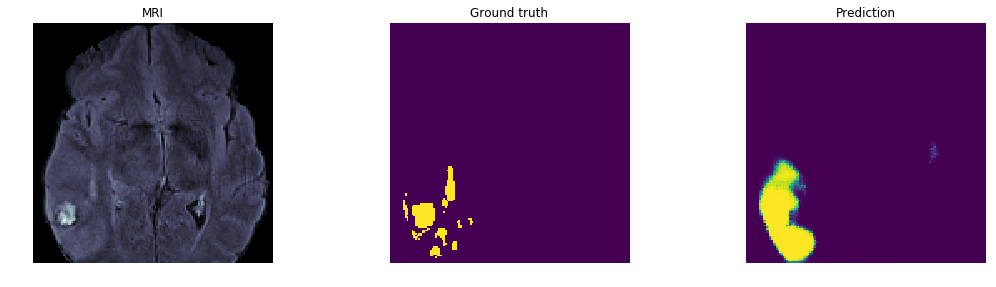

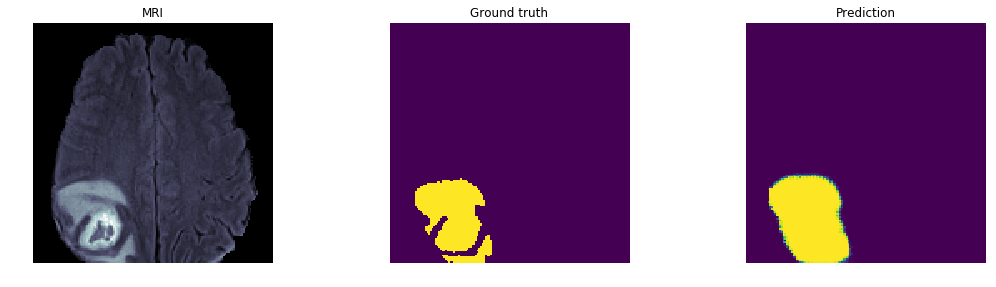

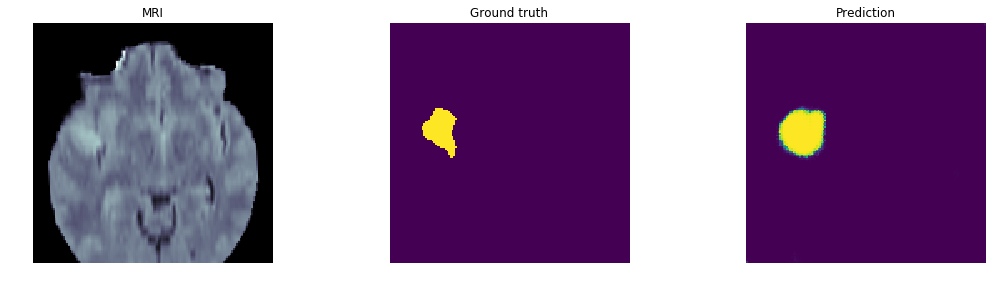

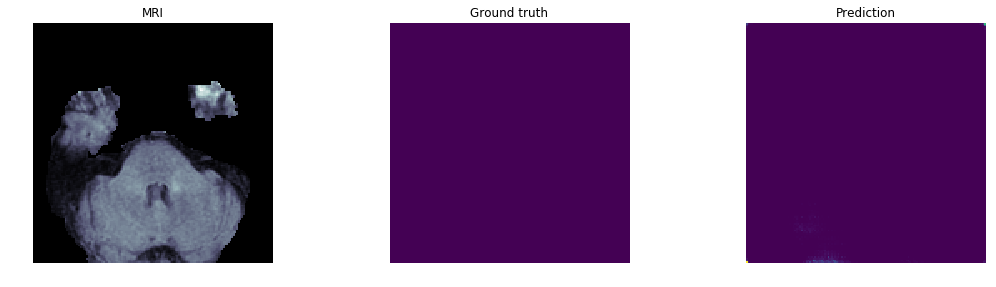

...

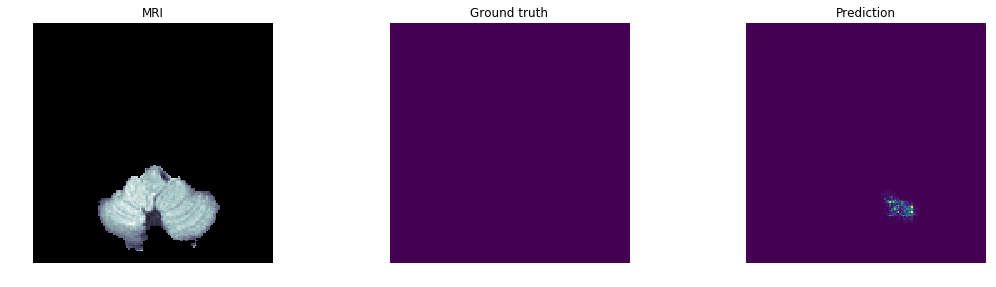

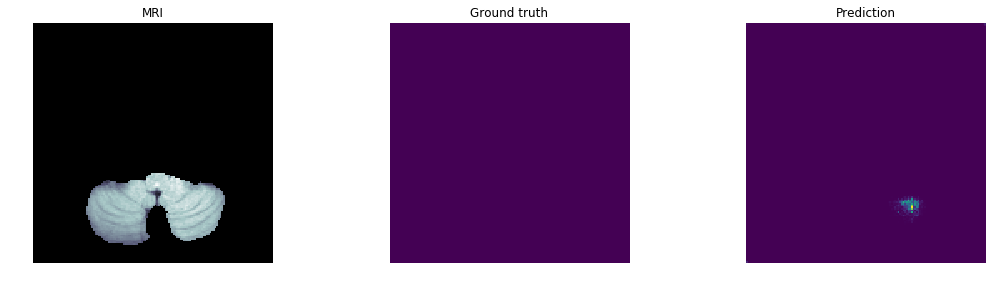

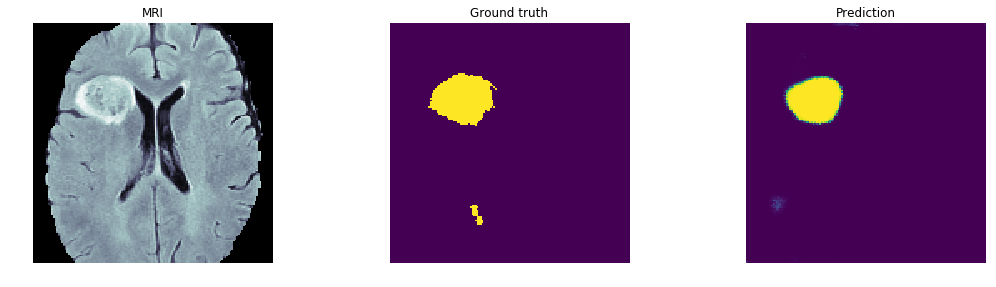

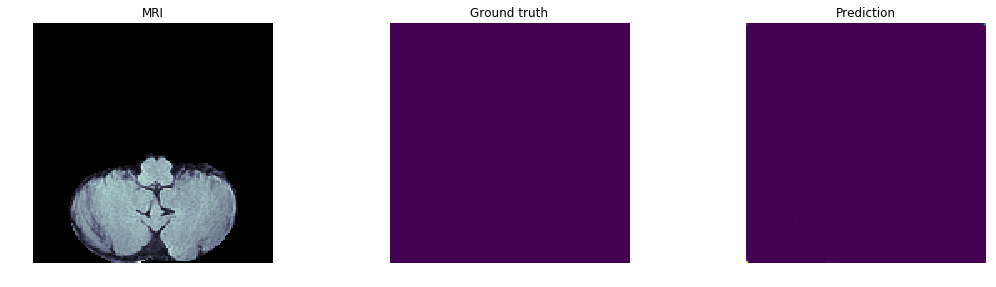

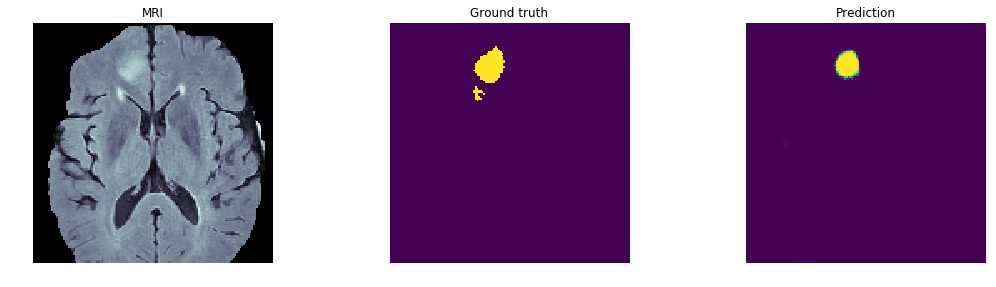

[ INFO ] Image #4385: Dice score = 0.7540
[ INFO ] Plotting the predictions and saving to png files. Please wait...
14 4 0


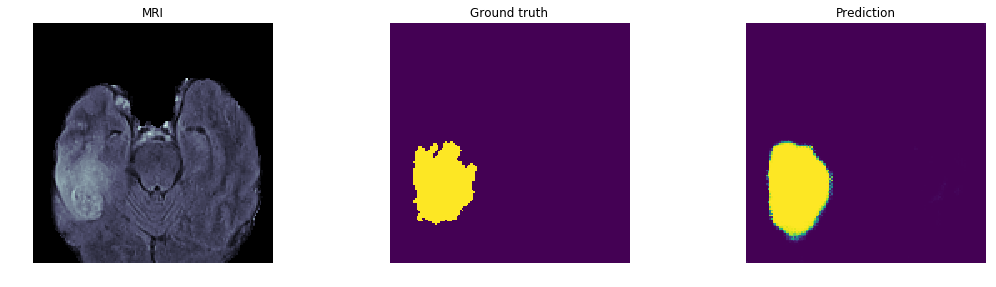

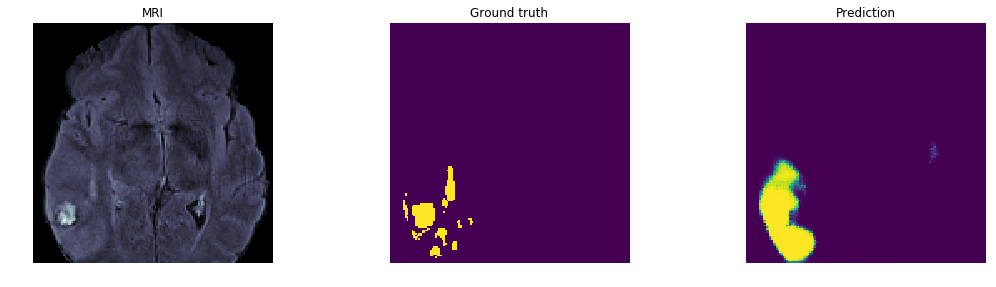

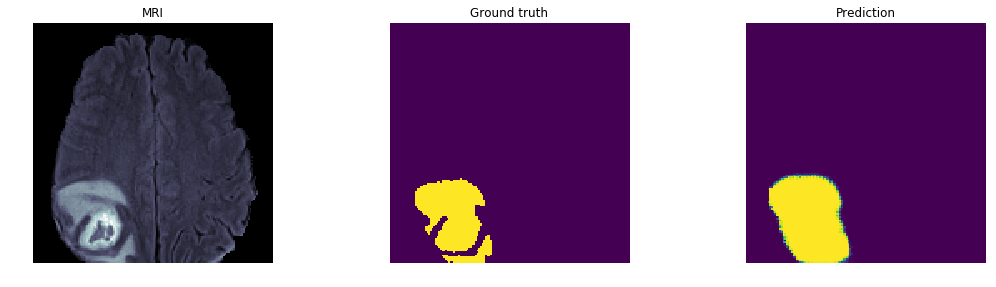

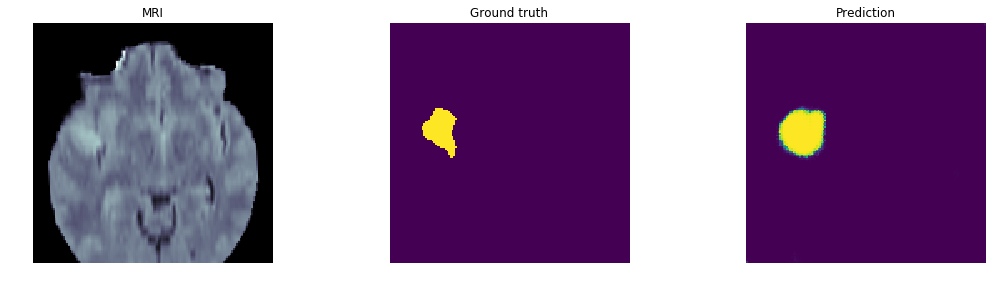

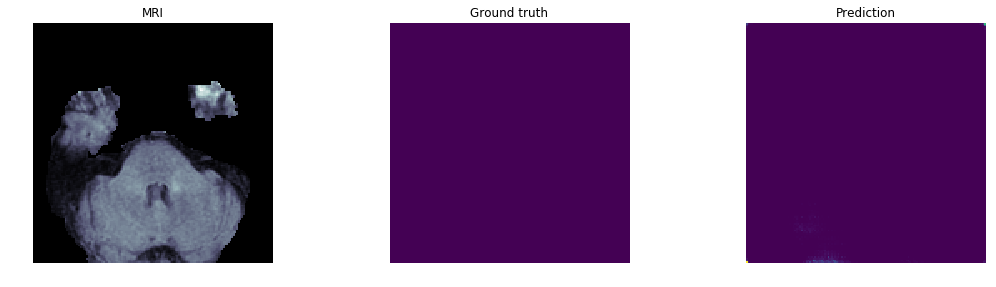

...

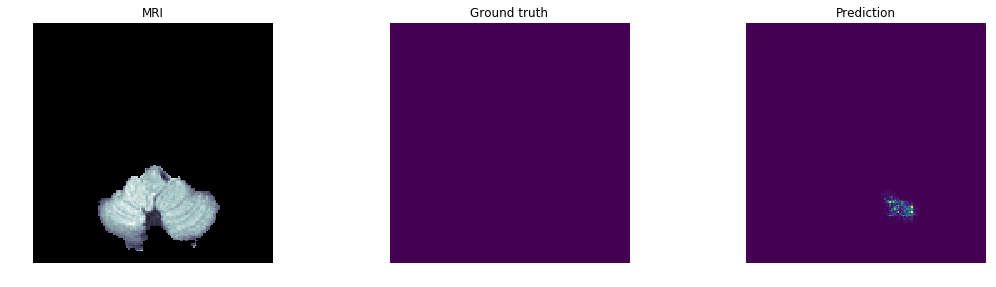

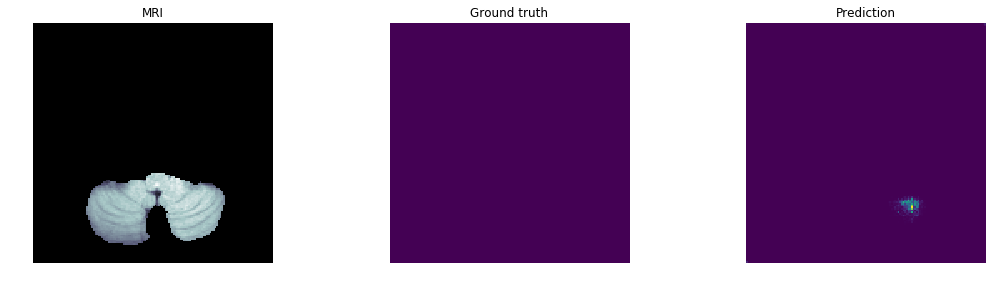

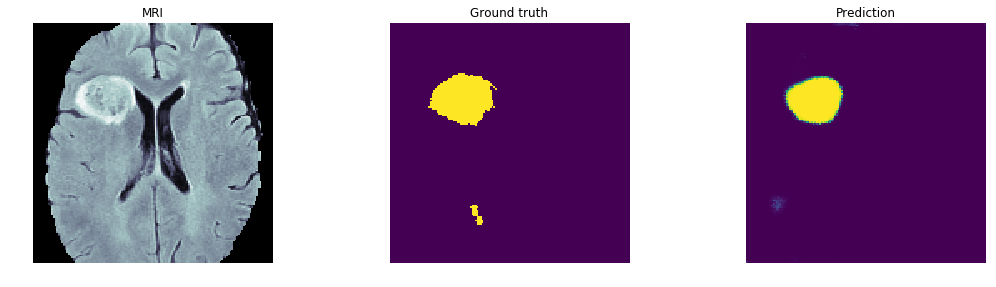

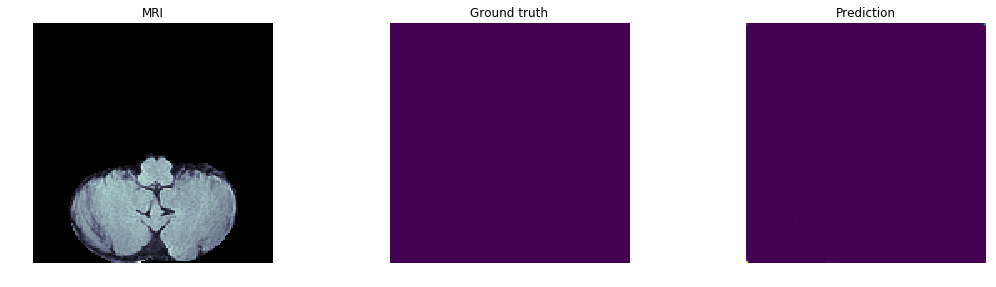

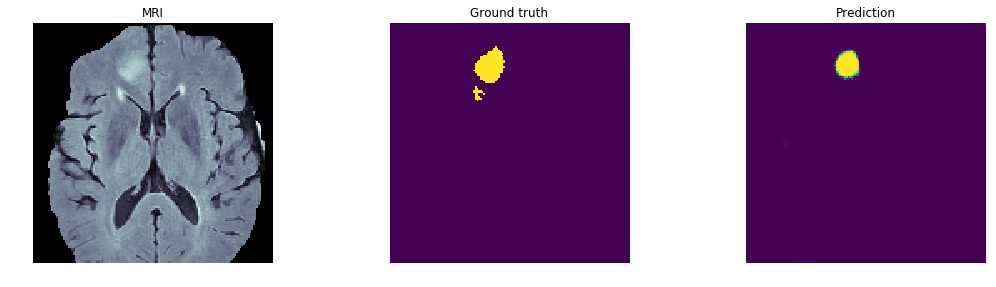

In [24]:
for idx in range(img_indicies.shape[0]):
    dice = dice_score(predictions[idx,0,:,:], label_data[idx,0,:,:])
    log.info("Image #{}: Dice score = {:.4f}".format(img_indicies[idx], dice))

    if args.plot:
        plot_predictions(predictions, input_data, label_data, img_indicies, args)

`Licensed under the Apache License, Version 2.0 (the "License"); you may not use this file except in compliance with the License. You may obtain a copy of the License at http://www.apache.org/licenses/LICENSE-2.0 Unless required by applicable law or agreed to in writing, software distributed under the License is distributed on an "AS IS" BASIS, WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied. See the License for the specific language governing permissions and limitations under the License. SPDX-License-Identifier: EPL-2.0`

`Copyright (c) 2019 Intel Corporation`